In [1]:
%cd ..
%ls

C:\Users\Dongmin Kim\Documents\OnlineTSAD
 C 드라이브의 볼륨에는 이름이 없습니다.
 볼륨 일련 번호: 067D-FB3E

 C:\Users\Dongmin Kim\Documents\OnlineTSAD 디렉터리

2023-05-02  오후 04:13    <DIR>          .
2023-05-02  오후 04:13    <DIR>          ..
2023-04-10  오후 01:01               156 .gitignore
2023-05-02  오후 08:37    <DIR>          .idea
2023-04-14  오후 04:53    <DIR>          .ipynb_checkpoints
2023-04-27  오후 09:03    <DIR>          cfgs
2023-05-02  오후 05:06    <DIR>          checkpoints
2023-05-02  오후 08:25    <DIR>          data
2023-05-01  오후 03:55    <DIR>          EDA
2023-05-02  오후 08:26    <DIR>          Exp
2023-05-02  오후 09:10    <DIR>          figures
2023-04-09  오후 02:54    <DIR>          hptune
2023-05-02  오후 05:06    <DIR>          logs
2023-05-02  오후 08:08    <DIR>          models
2023-04-26  오후 09:18    <DIR>          outputs
2023-05-02  오후 05:06    <DIR>          plots
2023-04-29  오후 06:53    <DIR>          results
2023-04-29  오후 03:46             3,599 test.py
2023-05-02  오후 04:13    <DIR>    

In [2]:
import numpy as np
import matplotlib as mat
from matplotlib import font_manager, rc

def setPlotStyle():    
    #mat.rcParams['font.family'] = "serif"
    #mat.rcParams['font.serif'] = ["Arial"]
    mat.rcParams['font.family'] = "sans-serif"
    mat.rcParams['font.sans-serif'] = "Times new roman"
    mat.rcParams["axes.titlesize"] = "x-large"
    mat.rcParams['font.size'] = 15
    mat.rcParams['legend.fontsize'] = 15
    mat.rcParams['lines.linewidth'] = 2
    mat.rcParams['lines.color'] = 'r'
    mat.rcParams['axes.grid'] = 1     
    mat.rcParams['axes.xmargin'] = 0.1     
    mat.rcParams['axes.ymargin'] = 0.1     
    mat.rcParams["mathtext.fontset"] = "dejavuserif" #"cm", "stix", etc.
    mat.rcParams['figure.dpi'] = 500
    mat.rcParams['savefig.dpi'] = 500
setPlotStyle()

In [3]:
import torch
from torch import optim
import torch.nn.functional as F

import matplotlib.pyplot as plt

from utils.metrics import get_summary_stats

from models.MLP import MLP

import wandb
import hydra
from omegaconf import DictConfig

from utils.logger import make_logger
from utils.argpass import prepare_arguments, configure_exp_id
from utils.tools import SEED_everything, plot_interval

import warnings
from data.load_data import DataFactory
from Exp.ReconBaselines import *

from easydict import EasyDict as edict
import yaml
import re
import copy

warnings.filterwarnings("ignore")

# load yaml
cfg = {}
loader = yaml.SafeLoader
loader.add_implicit_resolver(
    u'tag:yaml.org,2002:float',
    re.compile(u'''^(?:
     [-+]?(?:[0-9][0-9_]*)\\.[0-9_]*(?:[eE][-+]?[0-9]+)?
    |[-+]?(?:[0-9][0-9_]*)(?:[eE][-+]?[0-9]+)
    |\\.[0-9_]+(?:[eE][-+][0-9]+)?
    |[-+]?[0-9][0-9_]*(?::[0-5]?[0-9])+\\.[0-9_]*
    |[-+]?\\.(?:inf|Inf|INF)
    |\\.(?:nan|NaN|NAN))$''', re.X),
    list(u'-+0123456789.'))

# get cfg
model = "MLP"
with open("cfgs/test_defaults.yaml", "r") as file:
    basic_config = yaml.load(file, Loader=loader)
    cfg.update(basic_config)
with open(f"cfgs/model/{model}.yaml", "r") as file:
    model_config = yaml.load(file, Loader=loader)
    cfg.update({"model": model_config})

In [4]:
cfg['dataset'] = 'SWaT'
cfg["RevIN"] = 'SlowRevIN'
cfg["gamma"] = 0.99
args = prepare_arguments(cfg)
print(args)

logger = make_logger(os.path.join(args.log_path, f'{args.exp_id}.log'))
logger.info(f"Configurations: {args}")

# Data
logger.info(f"Preparing {args.dataset} dataset...")
datafactory = DataFactory(args, logger)
train_dataset, train_loader, test_dataset, test_loader = datafactory()
args.num_channels = train_dataset.X.shape[1]
train_X, train_y, test_X, test_y = train_dataset.X, train_dataset.y, test_dataset.X, test_dataset.y

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

[2023-05-02 21:11:25,688] Configurations: {'exp_id': 'MLP_SWaT_normalization_None', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'SWaT', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 12, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'None', 'gamma': 0.99, 'log_freq': 10, 'checkpoint_path': './checkpoints\\MLP_SWaT_normalization_None', 'log_path': './logs\\MLP_SWaT_normalization_None', 'output_path': './outputs\\MLP_SWaT_normalization_None', 'plot_path': './plots\\MLP_SWaT_normalization_None', 'result_path': './results\\MLP_SWaT_normalization_None', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'RevIN': 'SlowRevIN', 'home_dir': '.', 'device': device(type='cpu')}
[2023-05-02 21:11:25,689] Preparing SWaT dataset...
[202

{'exp_id': 'MLP_SWaT_normalization_None', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'SWaT', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 12, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'None', 'gamma': 0.99, 'log_freq': 10, 'checkpoint_path': './checkpoints\\MLP_SWaT_normalization_None', 'log_path': './logs\\MLP_SWaT_normalization_None', 'output_path': './outputs\\MLP_SWaT_normalization_None', 'plot_path': './plots\\MLP_SWaT_normalization_None', 'result_path': './results\\MLP_SWaT_normalization_None', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'RevIN': 'SlowRevIN', 'home_dir': '.', 'device': device(type='cpu')}


[2023-05-02 21:11:34,973] train: X - (496800, 51), y - (496800,) test: X - (449919, 51), y - (449919,)
[2023-05-02 21:11:35,048] Complete.
[2023-05-02 21:11:35,049] Preparing dataloader...
[2023-05-02 21:11:35,512] total train dataset- 647, batch_X - torch.Size([64, 12, 51]), batch_y - torch.Size([64, 12])
[2023-05-02 21:11:35,513] total test dataset- 37493, batch_X - torch.Size([1, 12, 51]), batch_y - torch.Size([1, 12])
[2023-05-02 21:11:35,514] Complete.


(496800, 51) (496800,) (449916, 51) (449916,)


## Visualize

In [5]:
data_df = pd.read_csv("data/SWaT/SWaT_Dataset_Attack_v0.csv", index_col=0)
data_df

,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,MV201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
Timestamp,,,,,,,,,,,,,,,,,,,,,
28/12/2015 10:00:00 AM,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,...,2,1,250.8652,1.649953,189.5988,0.000128,1,1,1,Normal
28/12/2015 10:00:01 AM,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,...,2,1,250.8652,1.649953,189.6789,0.000128,1,1,1,Normal
28/12/2015 10:00:02 AM,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,...,2,1,250.8812,1.649953,189.6789,0.000128,1,1,1,Normal
28/12/2015 10:00:03 AM,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,...,2,1,250.8812,1.649953,189.6148,0.000128,1,1,1,Normal
28/12/2015 10:00:04 AM,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,...,2,1,250.8812,1.649953,189.5027,0.000128,1,1,1,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2/1/2016 2:59:55 PM,2.559972,519.5495,2,2,1,168.0979,8.638683,301.9226,2.459488,2,...,2,1,251.1535,0.865024,189.0220,0.000000,1,1,1,Normal
2/1/2016 2:59:56 PM,2.549082,520.4131,2,2,1,168.0979,8.638683,301.9226,2.459488,2,...,2,1,251.0734,0.865024,188.9259,0.000000,1,1,1,Normal
2/1/2016 2:59:57 PM,2.531467,520.6878,2,2,1,168.0979,8.638683,301.9226,2.460129,2,...,2,1,251.0734,0.865024,188.9259,0.000000,1,1,1,Normal


In [6]:
cols = list(data_df.columns)

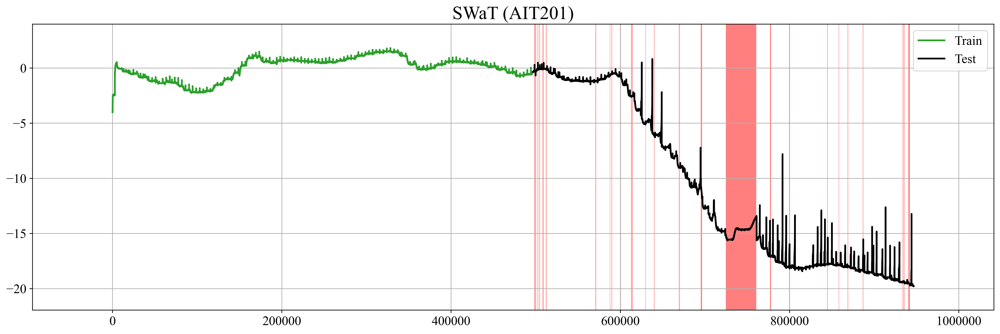

In [7]:
c = 5
dataset_name = "SWaT"

plt.figure(figsize=(20, 6), dpi=500)
plt.plot(train_X[:, c], color="C2", label="Train")
plt.plot(range(len(train_X), len(train_X)+len(test_X)), test_X[:, c], color="black", label="Test")
label = np.concatenate([np.array([0]*len(train_X)), test_y])
plot_interval(plt, label)
#plt.title(f"{dataset_name} ({cols[c]})")
plt.title(f"SWaT (AIT201)")

plt.legend()
plt.ticklabel_format(style="plain")
plt.show()

## distplot

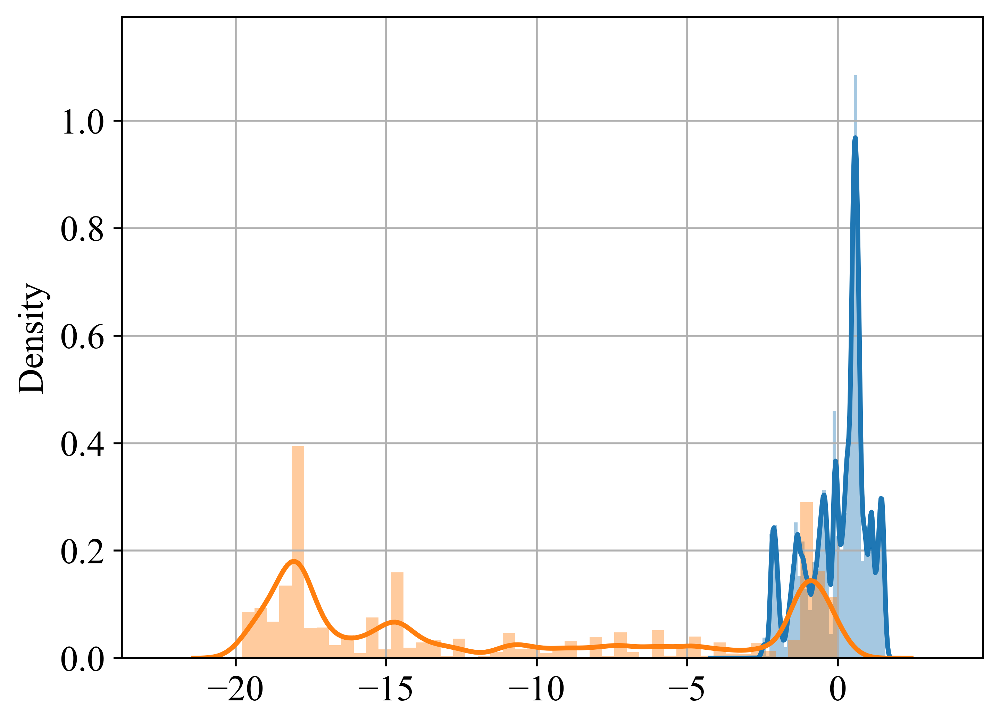

In [8]:
import seaborn as sns
c = 5
sns.distplot(train_X[:, c])
sns.distplot(test_X[:, c])
plt.show()

## TSNE Plot

In [21]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

In [18]:
#train_X, train_y, test_X, test_y = DataFactory.load_SWaT()
dataset = "MSL_P-15"
train_X, train_y, test_X, test_y = DataFactory.load_MSL("P-15")

In [26]:
def plot_tsne(dataset, train_X, train_y, test_X, test_y):
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    mask = (1-test_y).astype(bool)
    test_X = test_X[mask]
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    # 2d
    n_components = 2
    tsne = TSNE(n_components=n_components, verbose=1)
    Xtsne = tsne.fit_transform(np.concatenate([train_X, test_X]))
    plt.title(f"2d TSNE plot of {dataset}")
    plt.scatter(Xtsne[:,0], Xtsne[:,1], c=np.arange(0, len(Xtsne)), cmap="plasma", s=1)
    plt.colorbar()
    plt.show()
    
    # 3d
    n_components = 3
    tsne = TSNE(n_components=n_components, verbose=1)
    Xtsne = tsne.fit_transform(np.concatenate([train_X, test_X]))

    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(f"3d TSNE plot of {dataset}")
    p = ax.scatter(Xtsne[:,0], Xtsne[:,1], Xtsne[:,2], c=np.arange(0, len(Xtsne)), cmap="plasma", s=1)
    fig.colorbar(p)
    plt.show()

(496800, 51) (496800,) (449919, 51) (449919,)
(496800, 51) (496800,) (395335, 51) (449919,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 892135 samples in 0.027s...
[t-SNE] Computed neighbors for 892135 samples in 1136.939s...
[t-SNE] Computed conditional probabilities for sample 1000 / 892135
[t-SNE] Computed conditional probabilities for sample 2000 / 892135
[t-SNE] Computed conditional probabilities for sample 3000 / 892135
[t-SNE] Computed conditional probabilities for sample 4000 / 892135
[t-SNE] Computed conditional probabilities for sample 5000 / 892135
[t-SNE] Computed conditional probabilities for sample 6000 / 892135
[t-SNE] Computed conditional probabilities for sample 7000 / 892135
[t-SNE] Computed conditional probabilities for sample 8000 / 892135
[t-SNE] Computed conditional probabilities for sample 9000 / 892135
[t-SNE] Computed conditional probabilities for sample 10000 / 892135
[t-SNE] Computed conditional probabilities for sample 11000 / 892135
[t-SNE] Co

[t-SNE] Computed conditional probabilities for sample 121000 / 892135
[t-SNE] Computed conditional probabilities for sample 122000 / 892135
[t-SNE] Computed conditional probabilities for sample 123000 / 892135
[t-SNE] Computed conditional probabilities for sample 124000 / 892135
[t-SNE] Computed conditional probabilities for sample 125000 / 892135
[t-SNE] Computed conditional probabilities for sample 126000 / 892135
[t-SNE] Computed conditional probabilities for sample 127000 / 892135
[t-SNE] Computed conditional probabilities for sample 128000 / 892135
[t-SNE] Computed conditional probabilities for sample 129000 / 892135
[t-SNE] Computed conditional probabilities for sample 130000 / 892135
[t-SNE] Computed conditional probabilities for sample 131000 / 892135
[t-SNE] Computed conditional probabilities for sample 132000 / 892135
[t-SNE] Computed conditional probabilities for sample 133000 / 892135
[t-SNE] Computed conditional probabilities for sample 134000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 243000 / 892135
[t-SNE] Computed conditional probabilities for sample 244000 / 892135
[t-SNE] Computed conditional probabilities for sample 245000 / 892135
[t-SNE] Computed conditional probabilities for sample 246000 / 892135
[t-SNE] Computed conditional probabilities for sample 247000 / 892135
[t-SNE] Computed conditional probabilities for sample 248000 / 892135
[t-SNE] Computed conditional probabilities for sample 249000 / 892135
[t-SNE] Computed conditional probabilities for sample 250000 / 892135
[t-SNE] Computed conditional probabilities for sample 251000 / 892135
[t-SNE] Computed conditional probabilities for sample 252000 / 892135
[t-SNE] Computed conditional probabilities for sample 253000 / 892135
[t-SNE] Computed conditional probabilities for sample 254000 / 892135
[t-SNE] Computed conditional probabilities for sample 255000 / 892135
[t-SNE] Computed conditional probabilities for sample 256000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 384000 / 892135
[t-SNE] Computed conditional probabilities for sample 385000 / 892135
[t-SNE] Computed conditional probabilities for sample 386000 / 892135
[t-SNE] Computed conditional probabilities for sample 387000 / 892135
[t-SNE] Computed conditional probabilities for sample 388000 / 892135
[t-SNE] Computed conditional probabilities for sample 389000 / 892135
[t-SNE] Computed conditional probabilities for sample 390000 / 892135
[t-SNE] Computed conditional probabilities for sample 391000 / 892135
[t-SNE] Computed conditional probabilities for sample 392000 / 892135
[t-SNE] Computed conditional probabilities for sample 393000 / 892135
[t-SNE] Computed conditional probabilities for sample 394000 / 892135
[t-SNE] Computed conditional probabilities for sample 395000 / 892135
[t-SNE] Computed conditional probabilities for sample 396000 / 892135
[t-SNE] Computed conditional probabilities for sample 397000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 517000 / 892135
[t-SNE] Computed conditional probabilities for sample 518000 / 892135
[t-SNE] Computed conditional probabilities for sample 519000 / 892135
[t-SNE] Computed conditional probabilities for sample 520000 / 892135
[t-SNE] Computed conditional probabilities for sample 521000 / 892135
[t-SNE] Computed conditional probabilities for sample 522000 / 892135
[t-SNE] Computed conditional probabilities for sample 523000 / 892135
[t-SNE] Computed conditional probabilities for sample 524000 / 892135
[t-SNE] Computed conditional probabilities for sample 525000 / 892135
[t-SNE] Computed conditional probabilities for sample 526000 / 892135
[t-SNE] Computed conditional probabilities for sample 527000 / 892135
[t-SNE] Computed conditional probabilities for sample 528000 / 892135
[t-SNE] Computed conditional probabilities for sample 529000 / 892135
[t-SNE] Computed conditional probabilities for sample 530000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 647000 / 892135
[t-SNE] Computed conditional probabilities for sample 648000 / 892135
[t-SNE] Computed conditional probabilities for sample 649000 / 892135
[t-SNE] Computed conditional probabilities for sample 650000 / 892135
[t-SNE] Computed conditional probabilities for sample 651000 / 892135
[t-SNE] Computed conditional probabilities for sample 652000 / 892135
[t-SNE] Computed conditional probabilities for sample 653000 / 892135
[t-SNE] Computed conditional probabilities for sample 654000 / 892135
[t-SNE] Computed conditional probabilities for sample 655000 / 892135
[t-SNE] Computed conditional probabilities for sample 656000 / 892135
[t-SNE] Computed conditional probabilities for sample 657000 / 892135
[t-SNE] Computed conditional probabilities for sample 658000 / 892135
[t-SNE] Computed conditional probabilities for sample 659000 / 892135
[t-SNE] Computed conditional probabilities for sample 660000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 779000 / 892135
[t-SNE] Computed conditional probabilities for sample 780000 / 892135
[t-SNE] Computed conditional probabilities for sample 781000 / 892135
[t-SNE] Computed conditional probabilities for sample 782000 / 892135
[t-SNE] Computed conditional probabilities for sample 783000 / 892135
[t-SNE] Computed conditional probabilities for sample 784000 / 892135
[t-SNE] Computed conditional probabilities for sample 785000 / 892135
[t-SNE] Computed conditional probabilities for sample 786000 / 892135
[t-SNE] Computed conditional probabilities for sample 787000 / 892135
[t-SNE] Computed conditional probabilities for sample 788000 / 892135
[t-SNE] Computed conditional probabilities for sample 789000 / 892135
[t-SNE] Computed conditional probabilities for sample 790000 / 892135
[t-SNE] Computed conditional probabilities for sample 791000 / 892135
[t-SNE] Computed conditional probabilities for sample 792000 / 892135
[t-SNE] Computed con

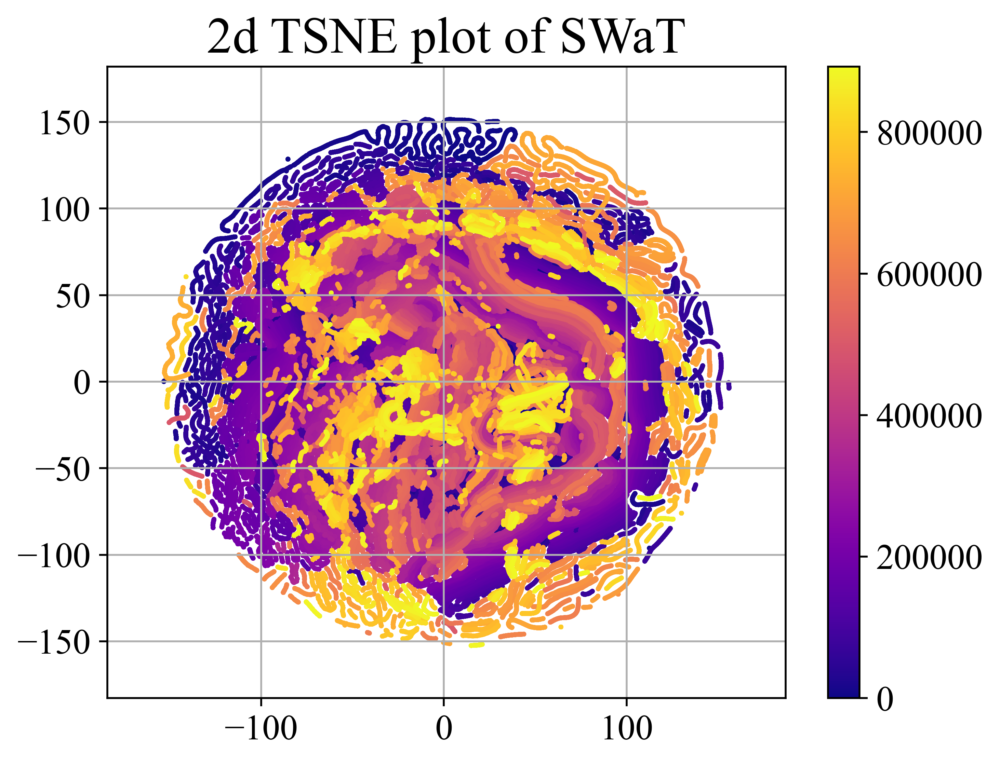

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 892135 samples in 0.024s...
[t-SNE] Computed neighbors for 892135 samples in 1136.182s...
[t-SNE] Computed conditional probabilities for sample 1000 / 892135
[t-SNE] Computed conditional probabilities for sample 2000 / 892135
[t-SNE] Computed conditional probabilities for sample 3000 / 892135
[t-SNE] Computed conditional probabilities for sample 4000 / 892135
[t-SNE] Computed conditional probabilities for sample 5000 / 892135
[t-SNE] Computed conditional probabilities for sample 6000 / 892135
[t-SNE] Computed conditional probabilities for sample 7000 / 892135
[t-SNE] Computed conditional probabilities for sample 8000 / 892135
[t-SNE] Computed conditional probabilities for sample 9000 / 892135
[t-SNE] Computed conditional probabilities for sample 10000 / 892135
[t-SNE] Computed conditional probabilities for sample 11000 / 892135
[t-SNE] Computed conditional probabilities for sample 12000 / 892135
[t-SNE] Computed conditional prob

[t-SNE] Computed conditional probabilities for sample 124000 / 892135
[t-SNE] Computed conditional probabilities for sample 125000 / 892135
[t-SNE] Computed conditional probabilities for sample 126000 / 892135
[t-SNE] Computed conditional probabilities for sample 127000 / 892135
[t-SNE] Computed conditional probabilities for sample 128000 / 892135
[t-SNE] Computed conditional probabilities for sample 129000 / 892135
[t-SNE] Computed conditional probabilities for sample 130000 / 892135
[t-SNE] Computed conditional probabilities for sample 131000 / 892135
[t-SNE] Computed conditional probabilities for sample 132000 / 892135
[t-SNE] Computed conditional probabilities for sample 133000 / 892135
[t-SNE] Computed conditional probabilities for sample 134000 / 892135
[t-SNE] Computed conditional probabilities for sample 135000 / 892135
[t-SNE] Computed conditional probabilities for sample 136000 / 892135
[t-SNE] Computed conditional probabilities for sample 137000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 254000 / 892135
[t-SNE] Computed conditional probabilities for sample 255000 / 892135
[t-SNE] Computed conditional probabilities for sample 256000 / 892135
[t-SNE] Computed conditional probabilities for sample 257000 / 892135
[t-SNE] Computed conditional probabilities for sample 258000 / 892135
[t-SNE] Computed conditional probabilities for sample 259000 / 892135
[t-SNE] Computed conditional probabilities for sample 260000 / 892135
[t-SNE] Computed conditional probabilities for sample 261000 / 892135
[t-SNE] Computed conditional probabilities for sample 262000 / 892135
[t-SNE] Computed conditional probabilities for sample 263000 / 892135
[t-SNE] Computed conditional probabilities for sample 264000 / 892135
[t-SNE] Computed conditional probabilities for sample 265000 / 892135
[t-SNE] Computed conditional probabilities for sample 266000 / 892135
[t-SNE] Computed conditional probabilities for sample 267000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 378000 / 892135
[t-SNE] Computed conditional probabilities for sample 379000 / 892135
[t-SNE] Computed conditional probabilities for sample 380000 / 892135
[t-SNE] Computed conditional probabilities for sample 381000 / 892135
[t-SNE] Computed conditional probabilities for sample 382000 / 892135
[t-SNE] Computed conditional probabilities for sample 383000 / 892135
[t-SNE] Computed conditional probabilities for sample 384000 / 892135
[t-SNE] Computed conditional probabilities for sample 385000 / 892135
[t-SNE] Computed conditional probabilities for sample 386000 / 892135
[t-SNE] Computed conditional probabilities for sample 387000 / 892135
[t-SNE] Computed conditional probabilities for sample 388000 / 892135
[t-SNE] Computed conditional probabilities for sample 389000 / 892135
[t-SNE] Computed conditional probabilities for sample 390000 / 892135
[t-SNE] Computed conditional probabilities for sample 391000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 500000 / 892135
[t-SNE] Computed conditional probabilities for sample 501000 / 892135
[t-SNE] Computed conditional probabilities for sample 502000 / 892135
[t-SNE] Computed conditional probabilities for sample 503000 / 892135
[t-SNE] Computed conditional probabilities for sample 504000 / 892135
[t-SNE] Computed conditional probabilities for sample 505000 / 892135
[t-SNE] Computed conditional probabilities for sample 506000 / 892135
[t-SNE] Computed conditional probabilities for sample 507000 / 892135
[t-SNE] Computed conditional probabilities for sample 508000 / 892135
[t-SNE] Computed conditional probabilities for sample 509000 / 892135
[t-SNE] Computed conditional probabilities for sample 510000 / 892135
[t-SNE] Computed conditional probabilities for sample 511000 / 892135
[t-SNE] Computed conditional probabilities for sample 512000 / 892135
[t-SNE] Computed conditional probabilities for sample 513000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 620000 / 892135
[t-SNE] Computed conditional probabilities for sample 621000 / 892135
[t-SNE] Computed conditional probabilities for sample 622000 / 892135
[t-SNE] Computed conditional probabilities for sample 623000 / 892135
[t-SNE] Computed conditional probabilities for sample 624000 / 892135
[t-SNE] Computed conditional probabilities for sample 625000 / 892135
[t-SNE] Computed conditional probabilities for sample 626000 / 892135
[t-SNE] Computed conditional probabilities for sample 627000 / 892135
[t-SNE] Computed conditional probabilities for sample 628000 / 892135
[t-SNE] Computed conditional probabilities for sample 629000 / 892135
[t-SNE] Computed conditional probabilities for sample 630000 / 892135
[t-SNE] Computed conditional probabilities for sample 631000 / 892135
[t-SNE] Computed conditional probabilities for sample 632000 / 892135
[t-SNE] Computed conditional probabilities for sample 633000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 758000 / 892135
[t-SNE] Computed conditional probabilities for sample 759000 / 892135
[t-SNE] Computed conditional probabilities for sample 760000 / 892135
[t-SNE] Computed conditional probabilities for sample 761000 / 892135
[t-SNE] Computed conditional probabilities for sample 762000 / 892135
[t-SNE] Computed conditional probabilities for sample 763000 / 892135
[t-SNE] Computed conditional probabilities for sample 764000 / 892135
[t-SNE] Computed conditional probabilities for sample 765000 / 892135
[t-SNE] Computed conditional probabilities for sample 766000 / 892135
[t-SNE] Computed conditional probabilities for sample 767000 / 892135
[t-SNE] Computed conditional probabilities for sample 768000 / 892135
[t-SNE] Computed conditional probabilities for sample 769000 / 892135
[t-SNE] Computed conditional probabilities for sample 770000 / 892135
[t-SNE] Computed conditional probabilities for sample 771000 / 892135
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 888000 / 892135
[t-SNE] Computed conditional probabilities for sample 889000 / 892135
[t-SNE] Computed conditional probabilities for sample 890000 / 892135
[t-SNE] Computed conditional probabilities for sample 891000 / 892135
[t-SNE] Computed conditional probabilities for sample 892000 / 892135
[t-SNE] Computed conditional probabilities for sample 892135 / 892135
[t-SNE] Mean sigma: 1.588690
[t-SNE] KL divergence after 250 iterations with early exaggeration: 97.998878
[t-SNE] KL divergence after 1000 iterations: 1.487266


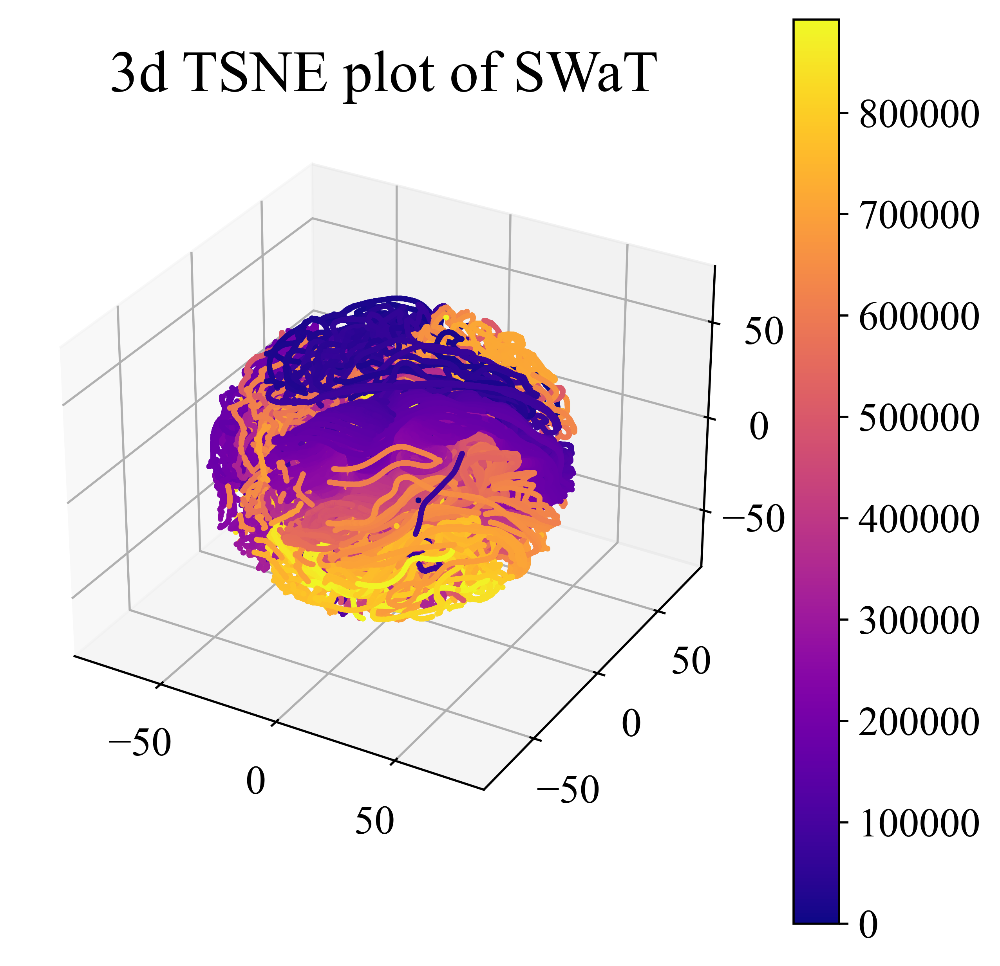

(784571, 123) (784571,) (172803, 123) (172803,)
(784571, 123) (784571,) (162826, 123) (172803,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 947397 samples in 0.077s...
[t-SNE] Computed neighbors for 947397 samples in 2928.153s...
[t-SNE] Computed conditional probabilities for sample 1000 / 947397
[t-SNE] Computed conditional probabilities for sample 2000 / 947397
[t-SNE] Computed conditional probabilities for sample 3000 / 947397
[t-SNE] Computed conditional probabilities for sample 4000 / 947397
[t-SNE] Computed conditional probabilities for sample 5000 / 947397
[t-SNE] Computed conditional probabilities for sample 6000 / 947397
[t-SNE] Computed conditional probabilities for sample 7000 / 947397
[t-SNE] Computed conditional probabilities for sample 8000 / 947397
[t-SNE] Computed conditional probabilities for sample 9000 / 947397
[t-SNE] Computed conditional probabilities for sample 10000 / 947397
[t-SNE] Computed conditional probabilities for sample 11000 / 947397
[t-SNE

[t-SNE] Computed conditional probabilities for sample 118000 / 947397
[t-SNE] Computed conditional probabilities for sample 119000 / 947397
[t-SNE] Computed conditional probabilities for sample 120000 / 947397
[t-SNE] Computed conditional probabilities for sample 121000 / 947397
[t-SNE] Computed conditional probabilities for sample 122000 / 947397
[t-SNE] Computed conditional probabilities for sample 123000 / 947397
[t-SNE] Computed conditional probabilities for sample 124000 / 947397
[t-SNE] Computed conditional probabilities for sample 125000 / 947397
[t-SNE] Computed conditional probabilities for sample 126000 / 947397
[t-SNE] Computed conditional probabilities for sample 127000 / 947397
[t-SNE] Computed conditional probabilities for sample 128000 / 947397
[t-SNE] Computed conditional probabilities for sample 129000 / 947397
[t-SNE] Computed conditional probabilities for sample 130000 / 947397
[t-SNE] Computed conditional probabilities for sample 131000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 245000 / 947397
[t-SNE] Computed conditional probabilities for sample 246000 / 947397
[t-SNE] Computed conditional probabilities for sample 247000 / 947397
[t-SNE] Computed conditional probabilities for sample 248000 / 947397
[t-SNE] Computed conditional probabilities for sample 249000 / 947397
[t-SNE] Computed conditional probabilities for sample 250000 / 947397
[t-SNE] Computed conditional probabilities for sample 251000 / 947397
[t-SNE] Computed conditional probabilities for sample 252000 / 947397
[t-SNE] Computed conditional probabilities for sample 253000 / 947397
[t-SNE] Computed conditional probabilities for sample 254000 / 947397
[t-SNE] Computed conditional probabilities for sample 255000 / 947397
[t-SNE] Computed conditional probabilities for sample 256000 / 947397
[t-SNE] Computed conditional probabilities for sample 257000 / 947397
[t-SNE] Computed conditional probabilities for sample 258000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 369000 / 947397
[t-SNE] Computed conditional probabilities for sample 370000 / 947397
[t-SNE] Computed conditional probabilities for sample 371000 / 947397
[t-SNE] Computed conditional probabilities for sample 372000 / 947397
[t-SNE] Computed conditional probabilities for sample 373000 / 947397
[t-SNE] Computed conditional probabilities for sample 374000 / 947397
[t-SNE] Computed conditional probabilities for sample 375000 / 947397
[t-SNE] Computed conditional probabilities for sample 376000 / 947397
[t-SNE] Computed conditional probabilities for sample 377000 / 947397
[t-SNE] Computed conditional probabilities for sample 378000 / 947397
[t-SNE] Computed conditional probabilities for sample 379000 / 947397
[t-SNE] Computed conditional probabilities for sample 380000 / 947397
[t-SNE] Computed conditional probabilities for sample 381000 / 947397
[t-SNE] Computed conditional probabilities for sample 382000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 489000 / 947397
[t-SNE] Computed conditional probabilities for sample 490000 / 947397
[t-SNE] Computed conditional probabilities for sample 491000 / 947397
[t-SNE] Computed conditional probabilities for sample 492000 / 947397
[t-SNE] Computed conditional probabilities for sample 493000 / 947397
[t-SNE] Computed conditional probabilities for sample 494000 / 947397
[t-SNE] Computed conditional probabilities for sample 495000 / 947397
[t-SNE] Computed conditional probabilities for sample 496000 / 947397
[t-SNE] Computed conditional probabilities for sample 497000 / 947397
[t-SNE] Computed conditional probabilities for sample 498000 / 947397
[t-SNE] Computed conditional probabilities for sample 499000 / 947397
[t-SNE] Computed conditional probabilities for sample 500000 / 947397
[t-SNE] Computed conditional probabilities for sample 501000 / 947397
[t-SNE] Computed conditional probabilities for sample 502000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 609000 / 947397
[t-SNE] Computed conditional probabilities for sample 610000 / 947397
[t-SNE] Computed conditional probabilities for sample 611000 / 947397
[t-SNE] Computed conditional probabilities for sample 612000 / 947397
[t-SNE] Computed conditional probabilities for sample 613000 / 947397
[t-SNE] Computed conditional probabilities for sample 614000 / 947397
[t-SNE] Computed conditional probabilities for sample 615000 / 947397
[t-SNE] Computed conditional probabilities for sample 616000 / 947397
[t-SNE] Computed conditional probabilities for sample 617000 / 947397
[t-SNE] Computed conditional probabilities for sample 618000 / 947397
[t-SNE] Computed conditional probabilities for sample 619000 / 947397
[t-SNE] Computed conditional probabilities for sample 620000 / 947397
[t-SNE] Computed conditional probabilities for sample 621000 / 947397
[t-SNE] Computed conditional probabilities for sample 622000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 742000 / 947397
[t-SNE] Computed conditional probabilities for sample 743000 / 947397
[t-SNE] Computed conditional probabilities for sample 744000 / 947397
[t-SNE] Computed conditional probabilities for sample 745000 / 947397
[t-SNE] Computed conditional probabilities for sample 746000 / 947397
[t-SNE] Computed conditional probabilities for sample 747000 / 947397
[t-SNE] Computed conditional probabilities for sample 748000 / 947397
[t-SNE] Computed conditional probabilities for sample 749000 / 947397
[t-SNE] Computed conditional probabilities for sample 750000 / 947397
[t-SNE] Computed conditional probabilities for sample 751000 / 947397
[t-SNE] Computed conditional probabilities for sample 752000 / 947397
[t-SNE] Computed conditional probabilities for sample 753000 / 947397
[t-SNE] Computed conditional probabilities for sample 754000 / 947397
[t-SNE] Computed conditional probabilities for sample 755000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 866000 / 947397
[t-SNE] Computed conditional probabilities for sample 867000 / 947397
[t-SNE] Computed conditional probabilities for sample 868000 / 947397
[t-SNE] Computed conditional probabilities for sample 869000 / 947397
[t-SNE] Computed conditional probabilities for sample 870000 / 947397
[t-SNE] Computed conditional probabilities for sample 871000 / 947397
[t-SNE] Computed conditional probabilities for sample 872000 / 947397
[t-SNE] Computed conditional probabilities for sample 873000 / 947397
[t-SNE] Computed conditional probabilities for sample 874000 / 947397
[t-SNE] Computed conditional probabilities for sample 875000 / 947397
[t-SNE] Computed conditional probabilities for sample 876000 / 947397
[t-SNE] Computed conditional probabilities for sample 877000 / 947397
[t-SNE] Computed conditional probabilities for sample 878000 / 947397
[t-SNE] Computed conditional probabilities for sample 879000 / 947397
[t-SNE] Computed con

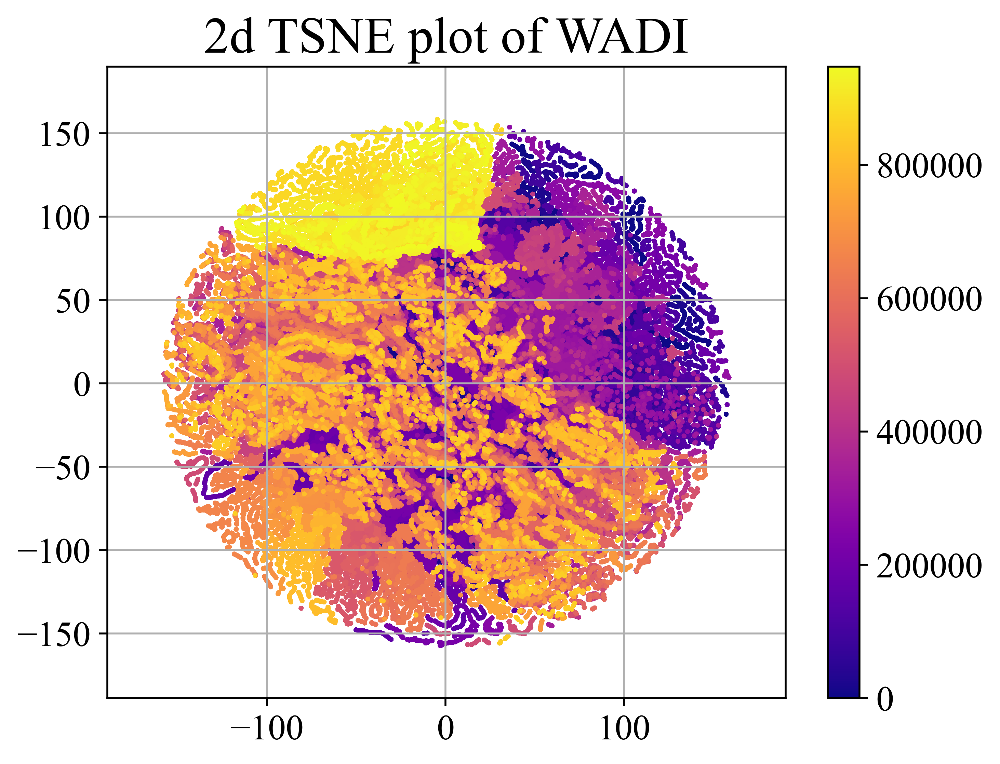

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 947397 samples in 0.059s...
[t-SNE] Computed neighbors for 947397 samples in 2909.811s...
[t-SNE] Computed conditional probabilities for sample 1000 / 947397
[t-SNE] Computed conditional probabilities for sample 2000 / 947397
[t-SNE] Computed conditional probabilities for sample 3000 / 947397
[t-SNE] Computed conditional probabilities for sample 4000 / 947397
[t-SNE] Computed conditional probabilities for sample 5000 / 947397
[t-SNE] Computed conditional probabilities for sample 6000 / 947397
[t-SNE] Computed conditional probabilities for sample 7000 / 947397
[t-SNE] Computed conditional probabilities for sample 8000 / 947397
[t-SNE] Computed conditional probabilities for sample 9000 / 947397
[t-SNE] Computed conditional probabilities for sample 10000 / 947397
[t-SNE] Computed conditional probabilities for sample 11000 / 947397
[t-SNE] Computed conditional probabilities for sample 12000 / 947397
[t-SNE] Computed conditional prob

[t-SNE] Computed conditional probabilities for sample 119000 / 947397
[t-SNE] Computed conditional probabilities for sample 120000 / 947397
[t-SNE] Computed conditional probabilities for sample 121000 / 947397
[t-SNE] Computed conditional probabilities for sample 122000 / 947397
[t-SNE] Computed conditional probabilities for sample 123000 / 947397
[t-SNE] Computed conditional probabilities for sample 124000 / 947397
[t-SNE] Computed conditional probabilities for sample 125000 / 947397
[t-SNE] Computed conditional probabilities for sample 126000 / 947397
[t-SNE] Computed conditional probabilities for sample 127000 / 947397
[t-SNE] Computed conditional probabilities for sample 128000 / 947397
[t-SNE] Computed conditional probabilities for sample 129000 / 947397
[t-SNE] Computed conditional probabilities for sample 130000 / 947397
[t-SNE] Computed conditional probabilities for sample 131000 / 947397
[t-SNE] Computed conditional probabilities for sample 132000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 241000 / 947397
[t-SNE] Computed conditional probabilities for sample 242000 / 947397
[t-SNE] Computed conditional probabilities for sample 243000 / 947397
[t-SNE] Computed conditional probabilities for sample 244000 / 947397
[t-SNE] Computed conditional probabilities for sample 245000 / 947397
[t-SNE] Computed conditional probabilities for sample 246000 / 947397
[t-SNE] Computed conditional probabilities for sample 247000 / 947397
[t-SNE] Computed conditional probabilities for sample 248000 / 947397
[t-SNE] Computed conditional probabilities for sample 249000 / 947397
[t-SNE] Computed conditional probabilities for sample 250000 / 947397
[t-SNE] Computed conditional probabilities for sample 251000 / 947397
[t-SNE] Computed conditional probabilities for sample 252000 / 947397
[t-SNE] Computed conditional probabilities for sample 253000 / 947397
[t-SNE] Computed conditional probabilities for sample 254000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 363000 / 947397
[t-SNE] Computed conditional probabilities for sample 364000 / 947397
[t-SNE] Computed conditional probabilities for sample 365000 / 947397
[t-SNE] Computed conditional probabilities for sample 366000 / 947397
[t-SNE] Computed conditional probabilities for sample 367000 / 947397
[t-SNE] Computed conditional probabilities for sample 368000 / 947397
[t-SNE] Computed conditional probabilities for sample 369000 / 947397
[t-SNE] Computed conditional probabilities for sample 370000 / 947397
[t-SNE] Computed conditional probabilities for sample 371000 / 947397
[t-SNE] Computed conditional probabilities for sample 372000 / 947397
[t-SNE] Computed conditional probabilities for sample 373000 / 947397
[t-SNE] Computed conditional probabilities for sample 374000 / 947397
[t-SNE] Computed conditional probabilities for sample 375000 / 947397
[t-SNE] Computed conditional probabilities for sample 376000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 488000 / 947397
[t-SNE] Computed conditional probabilities for sample 489000 / 947397
[t-SNE] Computed conditional probabilities for sample 490000 / 947397
[t-SNE] Computed conditional probabilities for sample 491000 / 947397
[t-SNE] Computed conditional probabilities for sample 492000 / 947397
[t-SNE] Computed conditional probabilities for sample 493000 / 947397
[t-SNE] Computed conditional probabilities for sample 494000 / 947397
[t-SNE] Computed conditional probabilities for sample 495000 / 947397
[t-SNE] Computed conditional probabilities for sample 496000 / 947397
[t-SNE] Computed conditional probabilities for sample 497000 / 947397
[t-SNE] Computed conditional probabilities for sample 498000 / 947397
[t-SNE] Computed conditional probabilities for sample 499000 / 947397
[t-SNE] Computed conditional probabilities for sample 500000 / 947397
[t-SNE] Computed conditional probabilities for sample 501000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 617000 / 947397
[t-SNE] Computed conditional probabilities for sample 618000 / 947397
[t-SNE] Computed conditional probabilities for sample 619000 / 947397
[t-SNE] Computed conditional probabilities for sample 620000 / 947397
[t-SNE] Computed conditional probabilities for sample 621000 / 947397
[t-SNE] Computed conditional probabilities for sample 622000 / 947397
[t-SNE] Computed conditional probabilities for sample 623000 / 947397
[t-SNE] Computed conditional probabilities for sample 624000 / 947397
[t-SNE] Computed conditional probabilities for sample 625000 / 947397
[t-SNE] Computed conditional probabilities for sample 626000 / 947397
[t-SNE] Computed conditional probabilities for sample 627000 / 947397
[t-SNE] Computed conditional probabilities for sample 628000 / 947397
[t-SNE] Computed conditional probabilities for sample 629000 / 947397
[t-SNE] Computed conditional probabilities for sample 630000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 741000 / 947397
[t-SNE] Computed conditional probabilities for sample 742000 / 947397
[t-SNE] Computed conditional probabilities for sample 743000 / 947397
[t-SNE] Computed conditional probabilities for sample 744000 / 947397
[t-SNE] Computed conditional probabilities for sample 745000 / 947397
[t-SNE] Computed conditional probabilities for sample 746000 / 947397
[t-SNE] Computed conditional probabilities for sample 747000 / 947397
[t-SNE] Computed conditional probabilities for sample 748000 / 947397
[t-SNE] Computed conditional probabilities for sample 749000 / 947397
[t-SNE] Computed conditional probabilities for sample 750000 / 947397
[t-SNE] Computed conditional probabilities for sample 751000 / 947397
[t-SNE] Computed conditional probabilities for sample 752000 / 947397
[t-SNE] Computed conditional probabilities for sample 753000 / 947397
[t-SNE] Computed conditional probabilities for sample 754000 / 947397
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 862000 / 947397
[t-SNE] Computed conditional probabilities for sample 863000 / 947397
[t-SNE] Computed conditional probabilities for sample 864000 / 947397
[t-SNE] Computed conditional probabilities for sample 865000 / 947397
[t-SNE] Computed conditional probabilities for sample 866000 / 947397
[t-SNE] Computed conditional probabilities for sample 867000 / 947397
[t-SNE] Computed conditional probabilities for sample 868000 / 947397
[t-SNE] Computed conditional probabilities for sample 869000 / 947397
[t-SNE] Computed conditional probabilities for sample 870000 / 947397
[t-SNE] Computed conditional probabilities for sample 871000 / 947397
[t-SNE] Computed conditional probabilities for sample 872000 / 947397
[t-SNE] Computed conditional probabilities for sample 873000 / 947397
[t-SNE] Computed conditional probabilities for sample 874000 / 947397
[t-SNE] Computed conditional probabilities for sample 875000 / 947397
[t-SNE] Computed con

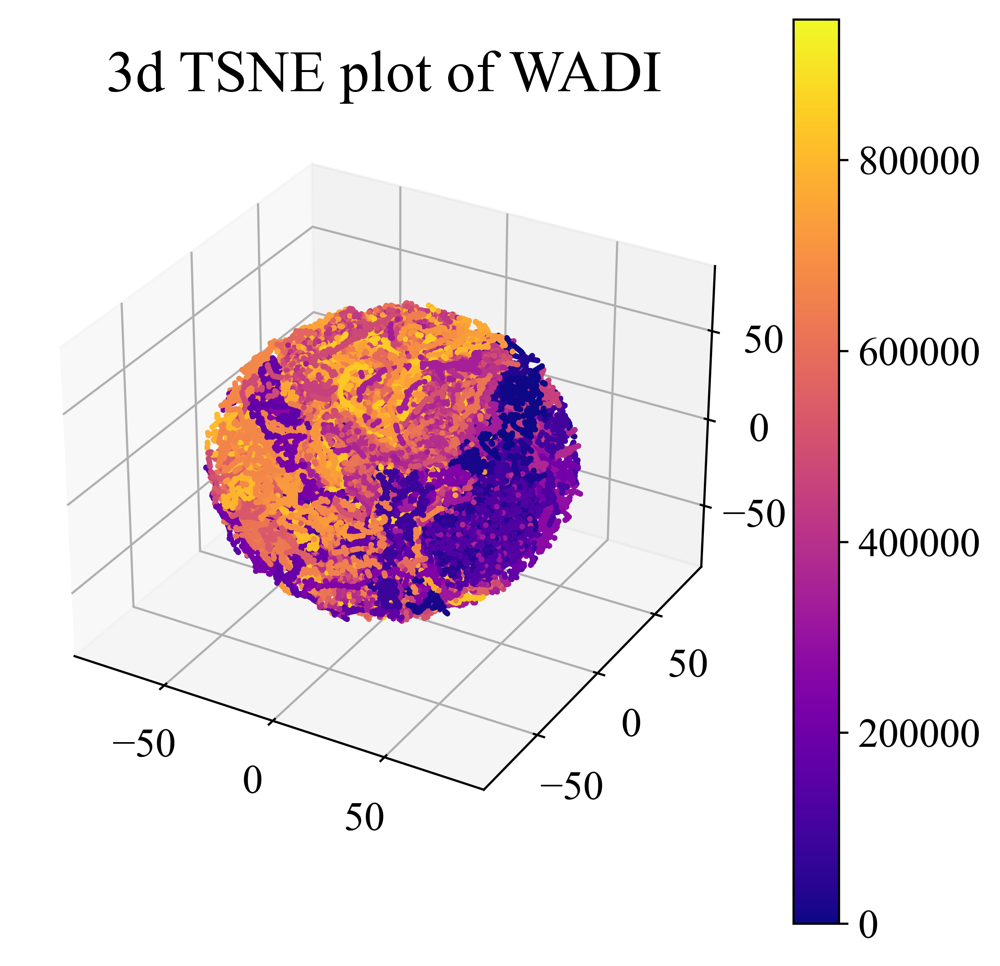

(132481, 25) (132481,) (87841, 25) (87841,)
(132481, 25) (132481,) (63460, 25) (87841,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 195941 samples in 0.003s...
[t-SNE] Computed neighbors for 195941 samples in 41.577s...
[t-SNE] Computed conditional probabilities for sample 1000 / 195941
[t-SNE] Computed conditional probabilities for sample 2000 / 195941
[t-SNE] Computed conditional probabilities for sample 3000 / 195941
[t-SNE] Computed conditional probabilities for sample 4000 / 195941
[t-SNE] Computed conditional probabilities for sample 5000 / 195941
[t-SNE] Computed conditional probabilities for sample 6000 / 195941
[t-SNE] Computed conditional probabilities for sample 7000 / 195941
[t-SNE] Computed conditional probabilities for sample 8000 / 195941
[t-SNE] Computed conditional probabilities for sample 9000 / 195941
[t-SNE] Computed conditional probabilities for sample 10000 / 195941
[t-SNE] Computed conditional probabilities for sample 11000 / 195941
[t-SNE] Computed

[t-SNE] Computed conditional probabilities for sample 118000 / 195941
[t-SNE] Computed conditional probabilities for sample 119000 / 195941
[t-SNE] Computed conditional probabilities for sample 120000 / 195941
[t-SNE] Computed conditional probabilities for sample 121000 / 195941
[t-SNE] Computed conditional probabilities for sample 122000 / 195941
[t-SNE] Computed conditional probabilities for sample 123000 / 195941
[t-SNE] Computed conditional probabilities for sample 124000 / 195941
[t-SNE] Computed conditional probabilities for sample 125000 / 195941
[t-SNE] Computed conditional probabilities for sample 126000 / 195941
[t-SNE] Computed conditional probabilities for sample 127000 / 195941
[t-SNE] Computed conditional probabilities for sample 128000 / 195941
[t-SNE] Computed conditional probabilities for sample 129000 / 195941
[t-SNE] Computed conditional probabilities for sample 130000 / 195941
[t-SNE] Computed conditional probabilities for sample 131000 / 195941
[t-SNE] Computed con

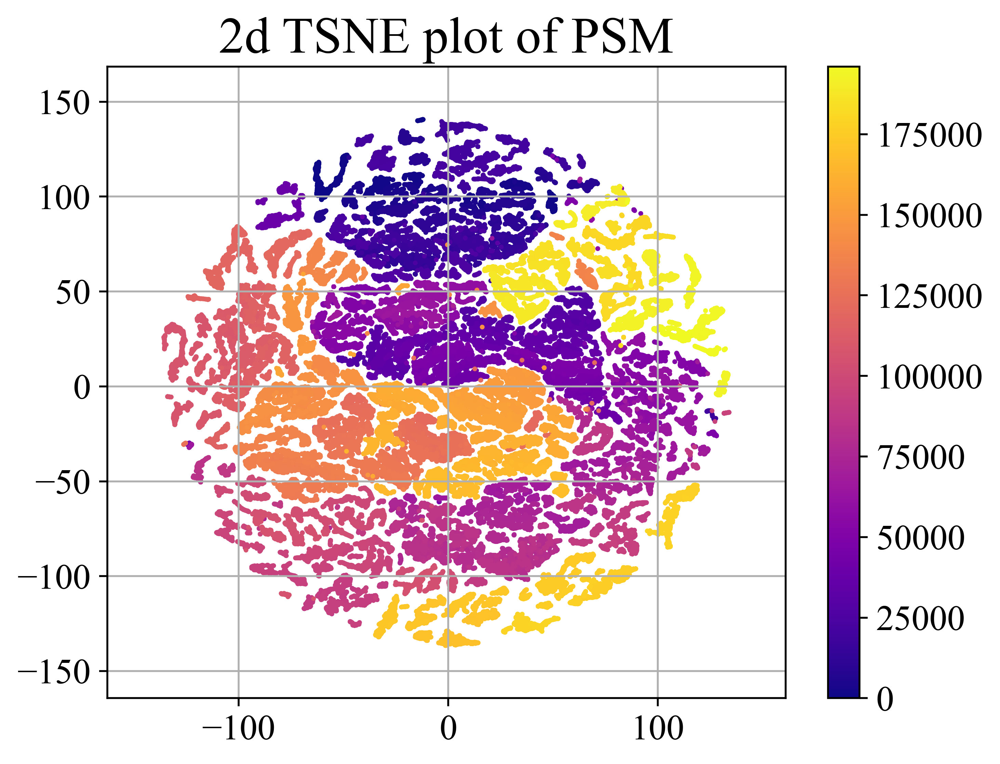

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 195941 samples in 0.005s...
[t-SNE] Computed neighbors for 195941 samples in 41.192s...
[t-SNE] Computed conditional probabilities for sample 1000 / 195941
[t-SNE] Computed conditional probabilities for sample 2000 / 195941
[t-SNE] Computed conditional probabilities for sample 3000 / 195941
[t-SNE] Computed conditional probabilities for sample 4000 / 195941
[t-SNE] Computed conditional probabilities for sample 5000 / 195941
[t-SNE] Computed conditional probabilities for sample 6000 / 195941
[t-SNE] Computed conditional probabilities for sample 7000 / 195941
[t-SNE] Computed conditional probabilities for sample 8000 / 195941
[t-SNE] Computed conditional probabilities for sample 9000 / 195941
[t-SNE] Computed conditional probabilities for sample 10000 / 195941
[t-SNE] Computed conditional probabilities for sample 11000 / 195941
[t-SNE] Computed conditional probabilities for sample 12000 / 195941
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 127000 / 195941
[t-SNE] Computed conditional probabilities for sample 128000 / 195941
[t-SNE] Computed conditional probabilities for sample 129000 / 195941
[t-SNE] Computed conditional probabilities for sample 130000 / 195941
[t-SNE] Computed conditional probabilities for sample 131000 / 195941
[t-SNE] Computed conditional probabilities for sample 132000 / 195941
[t-SNE] Computed conditional probabilities for sample 133000 / 195941
[t-SNE] Computed conditional probabilities for sample 134000 / 195941
[t-SNE] Computed conditional probabilities for sample 135000 / 195941
[t-SNE] Computed conditional probabilities for sample 136000 / 195941
[t-SNE] Computed conditional probabilities for sample 137000 / 195941
[t-SNE] Computed conditional probabilities for sample 138000 / 195941
[t-SNE] Computed conditional probabilities for sample 139000 / 195941
[t-SNE] Computed conditional probabilities for sample 140000 / 195941
[t-SNE] Computed con

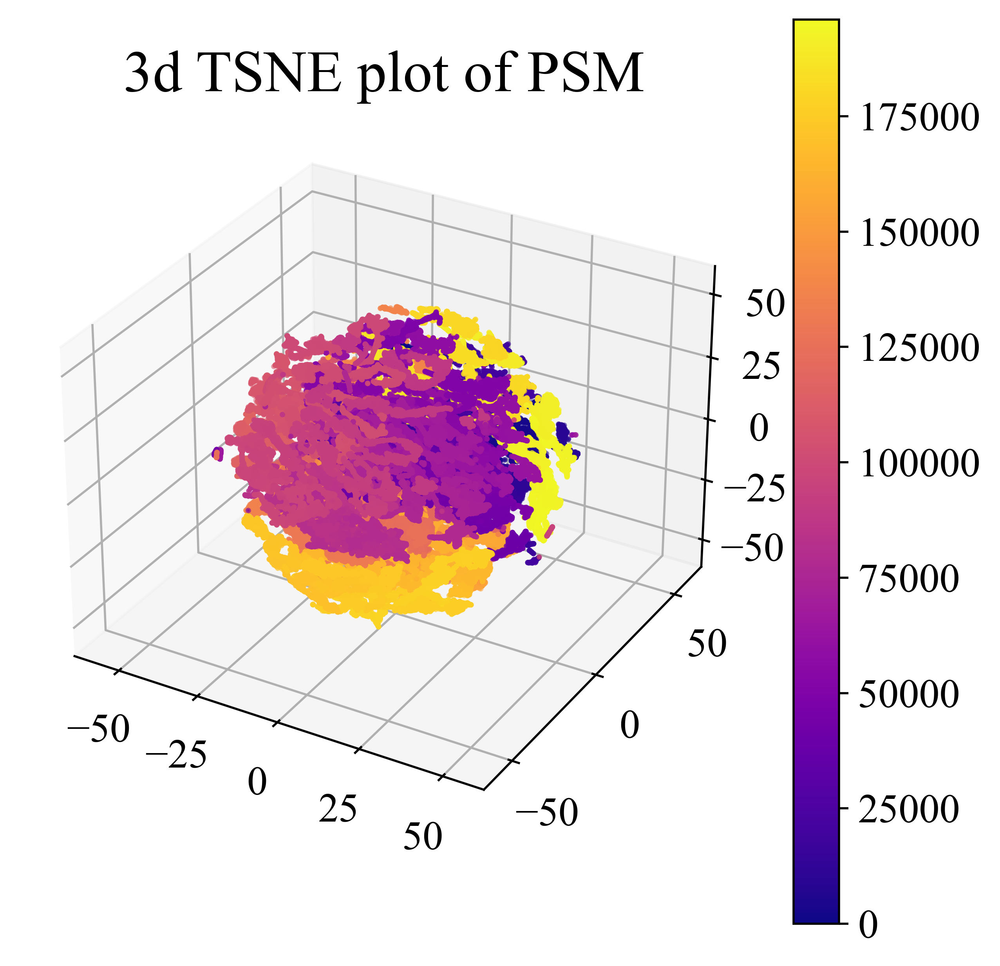

(142403, 29) (142403,) (142404, 29) (142404,)
(142403, 29) (142403,) (142181, 29) (142404,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 284584 samples in 0.005s...
[t-SNE] Computed neighbors for 284584 samples in 87.597s...
[t-SNE] Computed conditional probabilities for sample 1000 / 284584
[t-SNE] Computed conditional probabilities for sample 2000 / 284584
[t-SNE] Computed conditional probabilities for sample 3000 / 284584
[t-SNE] Computed conditional probabilities for sample 4000 / 284584
[t-SNE] Computed conditional probabilities for sample 5000 / 284584
[t-SNE] Computed conditional probabilities for sample 6000 / 284584
[t-SNE] Computed conditional probabilities for sample 7000 / 284584
[t-SNE] Computed conditional probabilities for sample 8000 / 284584
[t-SNE] Computed conditional probabilities for sample 9000 / 284584
[t-SNE] Computed conditional probabilities for sample 10000 / 284584
[t-SNE] Computed conditional probabilities for sample 11000 / 284584
[t-SNE] Comp

[t-SNE] Computed conditional probabilities for sample 131000 / 284584
[t-SNE] Computed conditional probabilities for sample 132000 / 284584
[t-SNE] Computed conditional probabilities for sample 133000 / 284584
[t-SNE] Computed conditional probabilities for sample 134000 / 284584
[t-SNE] Computed conditional probabilities for sample 135000 / 284584
[t-SNE] Computed conditional probabilities for sample 136000 / 284584
[t-SNE] Computed conditional probabilities for sample 137000 / 284584
[t-SNE] Computed conditional probabilities for sample 138000 / 284584
[t-SNE] Computed conditional probabilities for sample 139000 / 284584
[t-SNE] Computed conditional probabilities for sample 140000 / 284584
[t-SNE] Computed conditional probabilities for sample 141000 / 284584
[t-SNE] Computed conditional probabilities for sample 142000 / 284584
[t-SNE] Computed conditional probabilities for sample 143000 / 284584
[t-SNE] Computed conditional probabilities for sample 144000 / 284584
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 269000 / 284584
[t-SNE] Computed conditional probabilities for sample 270000 / 284584
[t-SNE] Computed conditional probabilities for sample 271000 / 284584
[t-SNE] Computed conditional probabilities for sample 272000 / 284584
[t-SNE] Computed conditional probabilities for sample 273000 / 284584
[t-SNE] Computed conditional probabilities for sample 274000 / 284584
[t-SNE] Computed conditional probabilities for sample 275000 / 284584
[t-SNE] Computed conditional probabilities for sample 276000 / 284584
[t-SNE] Computed conditional probabilities for sample 277000 / 284584
[t-SNE] Computed conditional probabilities for sample 278000 / 284584
[t-SNE] Computed conditional probabilities for sample 279000 / 284584
[t-SNE] Computed conditional probabilities for sample 280000 / 284584
[t-SNE] Computed conditional probabilities for sample 281000 / 284584
[t-SNE] Computed conditional probabilities for sample 282000 / 284584
[t-SNE] Computed con

KeyboardInterrupt: 

In [27]:
datasets = ["SWaT", "WADI", "PSM", "CreditCard", "MSL_P-15", "SMD_machine-1-4", "yahoo_20", "Pump"]
entropies = []

# SWaT
train_X, train_y, test_X, test_y = DataFactory.load_SWaT()
plot_tsne("SWaT", train_X, train_y, test_X, test_y)

# WADI
train_X, train_y, test_X, test_y = DataFactory.load_WADI()
plot_tsne("WADI", train_X, train_y, test_X, test_y)

# PSM
train_X, train_y, test_X, test_y = DataFactory.load_PSM()
plot_tsne("PSM", train_X, train_y, test_X, test_y)

# CreditCard
train_X, train_y, test_X, test_y = DataFactory.load_CreditCard()
plot_tsne("CreditCard", train_X, train_y, test_X, test_y)

# MSL_P-15
train_X, train_y, test_X, test_y = DataFactory.load_MSL("P-15")
plot_tsne("MSL_P-15", train_X, train_y, test_X, test_y)

# Pump
train_X, train_y, test_X, test_y = DataFactory.load_Pump()
plot_tsne("Pump", train_X, train_y, test_X, test_y)

# SMD_machine-1-4
train_X, train_y, test_X, test_y = DataFactory.load_SMD("machine-1-4")
plot_tsne("SMD_machine-1-4", train_X, train_y, test_X, test_y)

# yahoo_20
train_X, train_y, test_X, test_y = DataFactory.load_yahoo("20")
plot_tsne("yahoo_20", train_X, train_y, test_X, test_y)

In [19]:
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
mask = (1-test_y).astype(bool)
test_X = test_X[mask]
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(3682, 55) (3682,) (2856, 55) (2856,)
(3682, 55) (3682,) (2836, 55) (2856,)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6518 samples in 0.001s...
[t-SNE] Computed neighbors for 6518 samples in 0.274s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6518
[t-SNE] Computed conditional probabilities for sample 2000 / 6518
[t-SNE] Computed conditional probabilities for sample 3000 / 6518
[t-SNE] Computed conditional probabilities for sample 4000 / 6518
[t-SNE] Computed conditional probabilities for sample 5000 / 6518
[t-SNE] Computed conditional probabilities for sample 6000 / 6518
[t-SNE] Computed conditional probabilities for sample 6518 / 6518
[t-SNE] Mean sigma: 0.000213
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.901531
[t-SNE] KL divergence after 1000 iterations: 0.042090


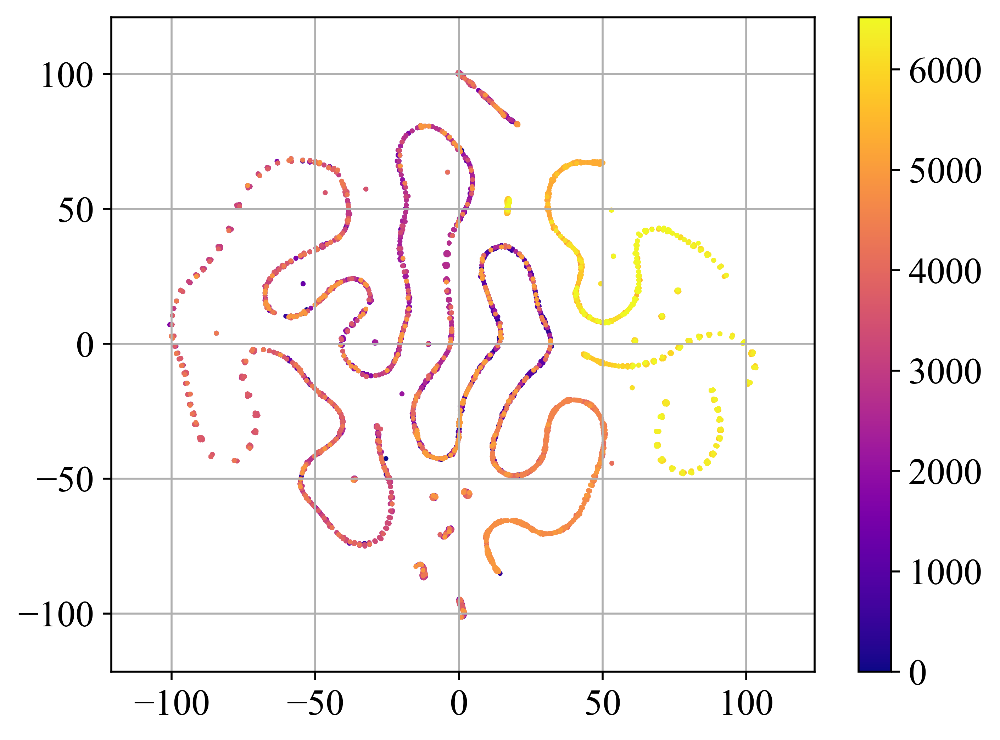

In [20]:
n_components = 2
tsne = TSNE(n_components=n_components, verbose=1)
Xtsne = tsne.fit_transform(np.concatenate([train_X, test_X]))
plt.title(f"2d TSNE plot of {dataset}")
plt.scatter(Xtsne[:,0], Xtsne[:,1], c=np.arange(0, len(Xtsne)), cmap="plasma", s=1)
plt.colorbar()
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6518 samples in 0.000s...
[t-SNE] Computed neighbors for 6518 samples in 0.285s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6518
[t-SNE] Computed conditional probabilities for sample 2000 / 6518
[t-SNE] Computed conditional probabilities for sample 3000 / 6518
[t-SNE] Computed conditional probabilities for sample 4000 / 6518
[t-SNE] Computed conditional probabilities for sample 5000 / 6518
[t-SNE] Computed conditional probabilities for sample 6000 / 6518
[t-SNE] Computed conditional probabilities for sample 6518 / 6518
[t-SNE] Mean sigma: 0.000213
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.205070
[t-SNE] KL divergence after 1000 iterations: -0.037604


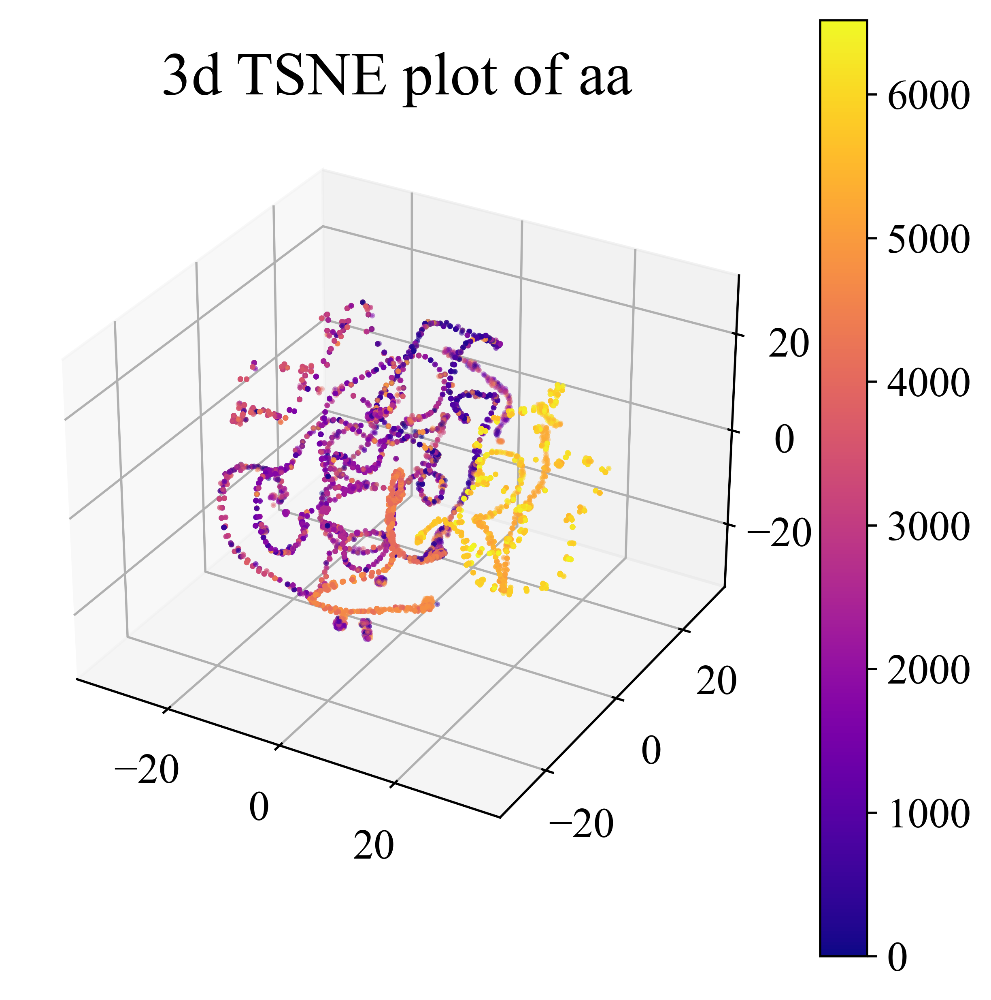

In [24]:
n_components = 3
tsne = TSNE(n_components=n_components, verbose=1)
Xtsne = tsne.fit_transform(np.concatenate([train_X, test_X]))

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.set_title(f"3d TSNE plot of {dataset}")
p = ax.scatter(Xtsne[:,0], Xtsne[:,1], Xtsne[:,2], c=np.arange(0, len(Xtsne)), cmap="plasma", s=1)
fig.colorbar(p)
plt.show()

## PCA dynamics plot

In [13]:
# SWaT
#train_X, train_y, test_X, test_y = DataFactory.load_SWaT()
train_X, train_y, test_X, test_y = DataFactory.load_MSL("P-15")

In [10]:
from sklearn.decomposition import PCA
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
mask = (1-test_y).astype(bool)
test_X = test_X[mask]
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(3682, 55) (3682,) (2856, 55) (2856,)
(3682, 55) (3682,) (2836, 55) (2856,)


[2023-05-02 21:09:02,169] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


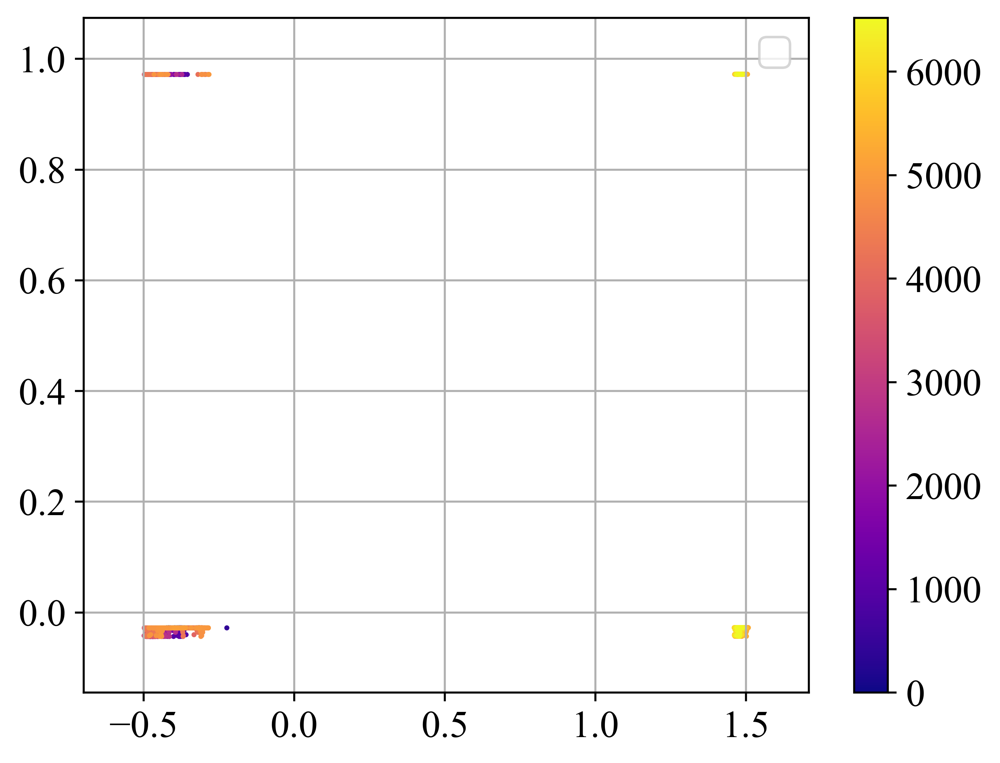

In [12]:
# 2d
pca = PCA(n_components=2) 
Xpca = pca.fit_transform(np.concatenate([train_X, test_X]))
Xpca.shape
Xpca_train = Xpca[:len(train_X)]
Xpca_test = Xpca[len(train_X):]

plt.scatter(Xpca[:,0], Xpca[:,1], c=np.arange(0, len(Xpca)), cmap="plasma", s=1)

#plt.scatter(Xpca_train[:,0], Xpca_train[:,1], c=np.arange(0, len(train_X)), cmap="plasma")
#plt.scatter(Xpca_train[:,0], Xpca_train[:,1], color="C1", label="train")
#plt.scatter(Xpca_test[:,0], Xpca_test[:,1], c=np.arange(0, len(test_X)), cmap="gray", label="test")
plt.colorbar()
plt.legend()
plt.show()

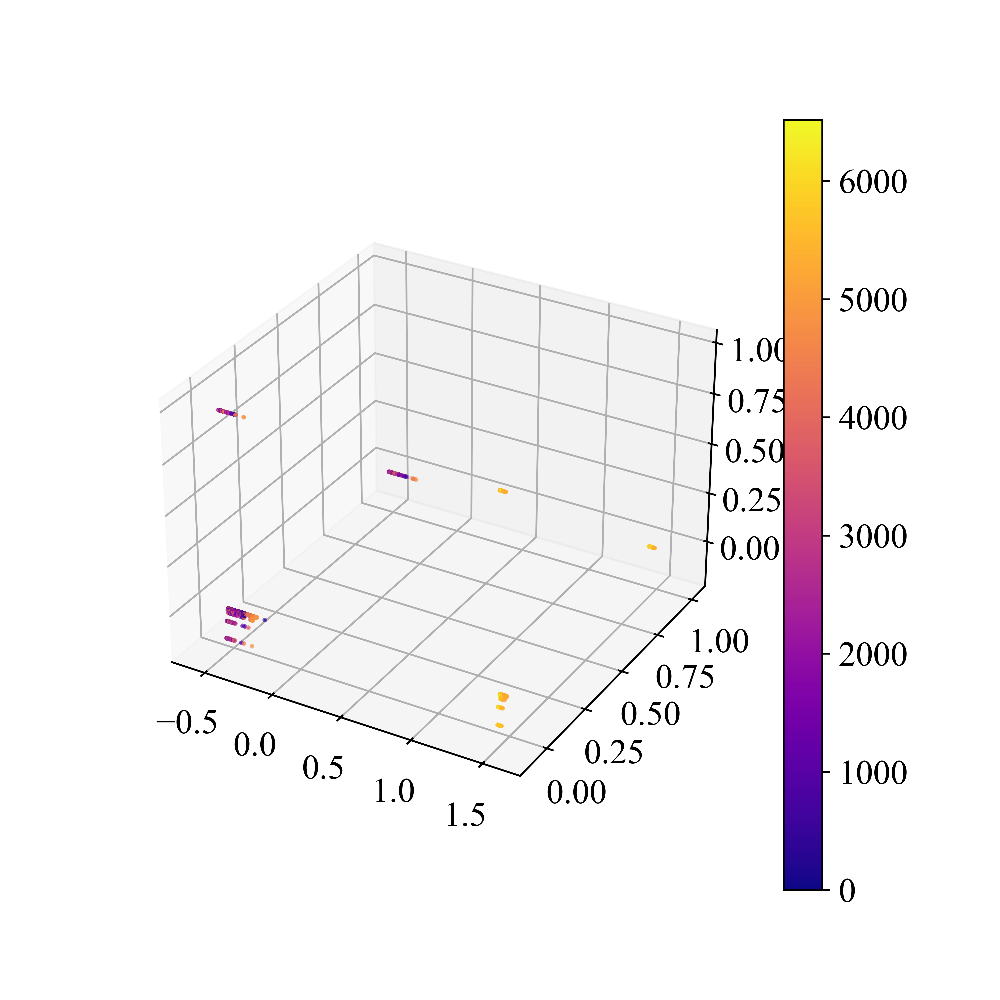

In [14]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
#%matplotlib widget
pca = PCA(n_components=3) 
Xpca = pca.fit_transform(np.concatenate([train_X, test_X]))
Xpca_train = Xpca[:len(train_X)]
Xpca_test = Xpca[len(train_X):]

fig = plt.figure(figsize=(6, 6))

#ax = Axes3D(fig)
ax = fig.add_subplot(111, projection='3d')

p = ax.scatter(Xpca[:,0], Xpca[:,1], Xpca[:,2], c=np.arange(0, len(Xpca)), cmap="plasma", s=1)



#ax.scatter(Xpca_train[:,0], Xpca_train[:,1], Xpca_train[:,2], color="C1", label="train")
#p = ax.scatter(Xpca_test[:,0], Xpca_test[:,1], Xpca_test[:,2], c=np.arange(0, len(test_X)), cmap="gray", label="test")
fig.colorbar(p)
#plt.legend()
plt.show()

In [73]:
fig = plt.figure()
ax = fig.gca(projection="3d")
ax.scatter(Xpca_train[:,0], Xpca_train[:,1], Xpca_train[:,2], color="C1", label="train")
ax.scatter(Xpca_test[:,0], Xpca_test[:,1], Xpca_test[:,2], c=np.arange(0, len(test_X)), cmap="gray", label="test")
ax.legend()
plt.show()

TypeError: FigureBase.gca() got an unexpected keyword argument 'projection'

<Figure size 3200x2400 with 0 Axes>

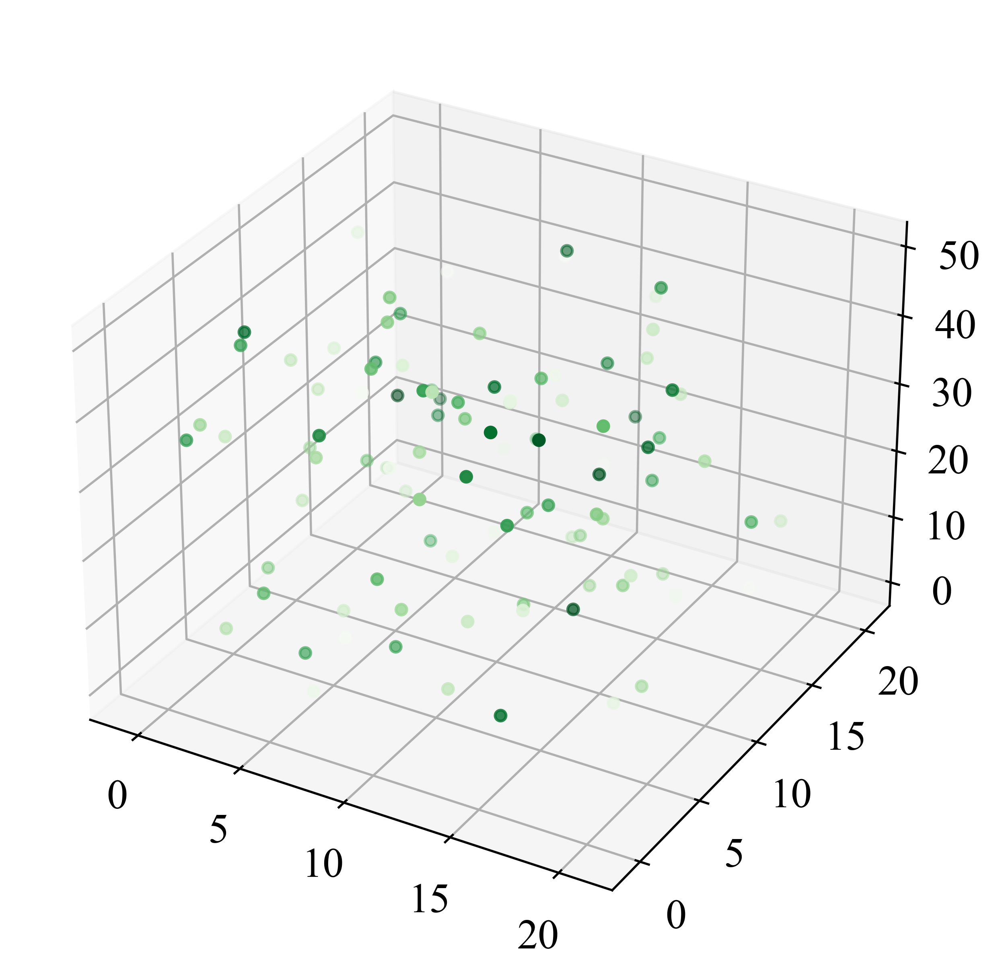

In [74]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

n = 100
xmin, xmax, ymin, ymax, zmin, zmax = 0, 20, 0, 20, 0, 50
cmin, cmax = 0, 2

xs = np.array([(xmax - xmin) * np.random.random_sample() + xmin for i in range(n)])
ys = np.array([(ymax - ymin) * np.random.random_sample() + ymin for i in range(n)])
zs = np.array([(zmax - zmin) * np.random.random_sample() + zmin for i in range(n)])
color = np.array([(cmax - cmin) * np.random.random_sample() + cmin for i in range(n)])

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs, ys, zs, c=color, marker='o', s=15, cmap='Greens')

plt.show()

## PCA plots

In [42]:
from scipy.stats import gaussian_kde, entropy
from sklearn.decomposition import PCA

In [59]:
def plot_pcavar_return_entropy(train_X, train_y, test_X, test_y):
    print("finding PCA...")
    T, C = train_X.shape
    
    # filter anomalies
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    mask = (1-test_y).astype(bool)
    test_X = test_X[mask]
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    if C <= 2:
        e = kldiv(test_X, train_X)
    else:
        x = range(1, min(C, 31))
        d = -1
        evar = []
        for n in x:
            pca = PCA(n_components=n)
            Xpca = pca.fit_transform(train_X)
            evar.append(sum(pca.explained_variance_ratio_))
            if d == -1 and sum(pca.explained_variance_ratio_) > 0.99 :
                d = n
        print("Done!")
        plt.plot(x, evar)
        plt.axvline(d)
        plt.show()
    
        # kde of PCA'ed outputs.
        pca = PCA(n_components=d) 
        Xpca_train = pca.fit_transform(train_X)
        Xpca_test = pca.fit_transform(test_X)
    
        e = kldiv(Xpca_test, Xpca_train)
    
    #Xm = np.concatenate([Xpca_train, Xpca_test]).min(axis=0)
    #XM = np.concatenate([Xpca_train, Xpca_test]).max(axis=0)
    
    #grid = np.linspace(Xm, XM, 100).T
    #train_kde = gaussian_kde(Xpca_train.T)
    #test_kde = gaussian_kde(Xpca_test.T)
    
    #import pdb;pdb.set_trace();
    
    
    #e = entropy(test_kde(grid), train_kde(grid)) # how much information should be gained, from train, to test.
    print(e)
    print("="*20)
    return e

In [57]:
Xpca_train.shape

(132481, 13)

In [60]:
# yahoo_20
train_X, train_y, test_X, test_y = DataFactory.load_yahoo("20")
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)


finding PCA...
(400, 1) (400,) (1022, 1) (1022,)
(400, 1) (400,) (989, 1) (1022,)
nan


finding PCA...
Done!


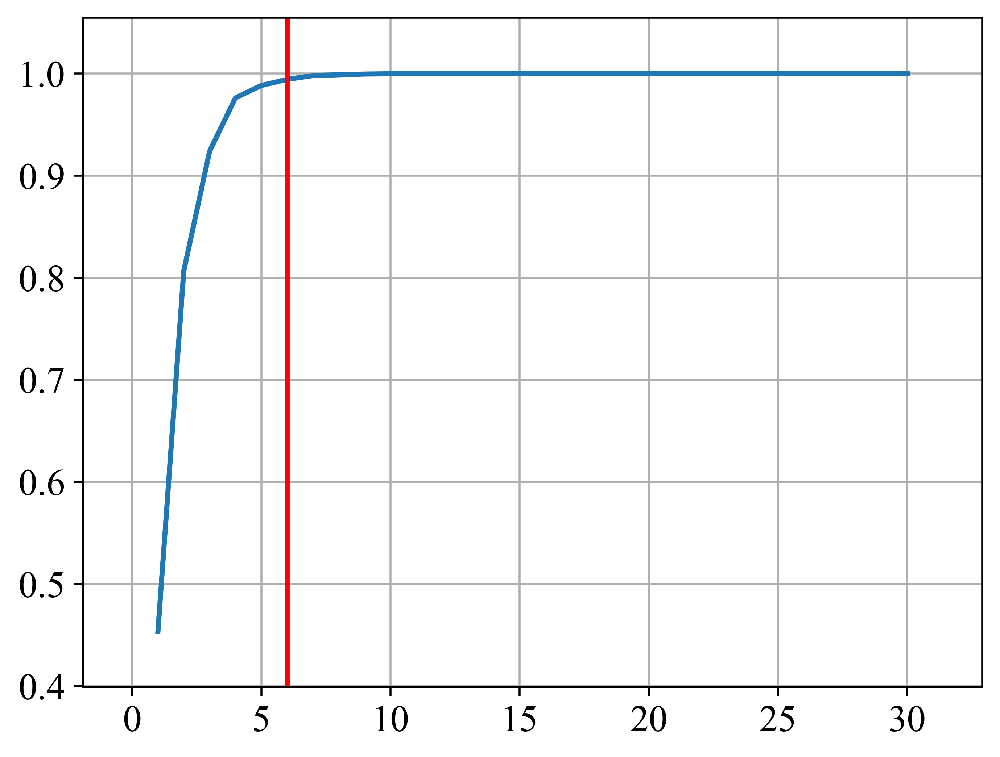

(496800, 51) (496800,) (449919, 51) (449919,)
(496800, 51) (496800,) (395335, 51) (449919,)
38.91240909912191
finding PCA...
Done!


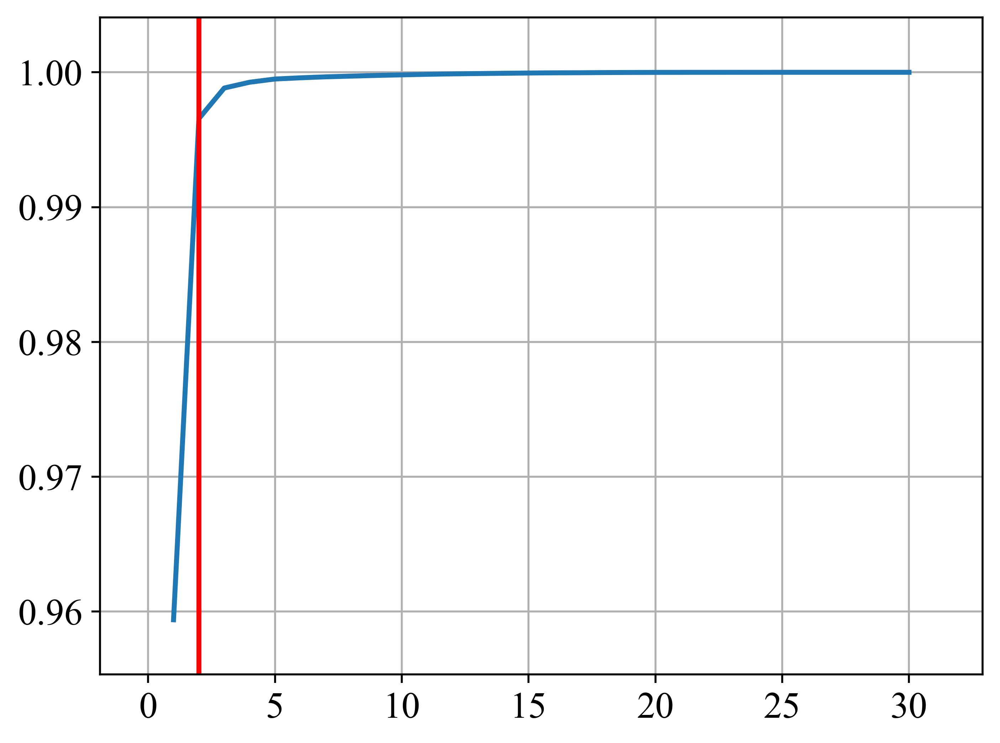

(784571, 123) (784571,) (172803, 123) (172803,)
(784571, 123) (784571,) (162826, 123) (172803,)
inf
finding PCA...
Done!


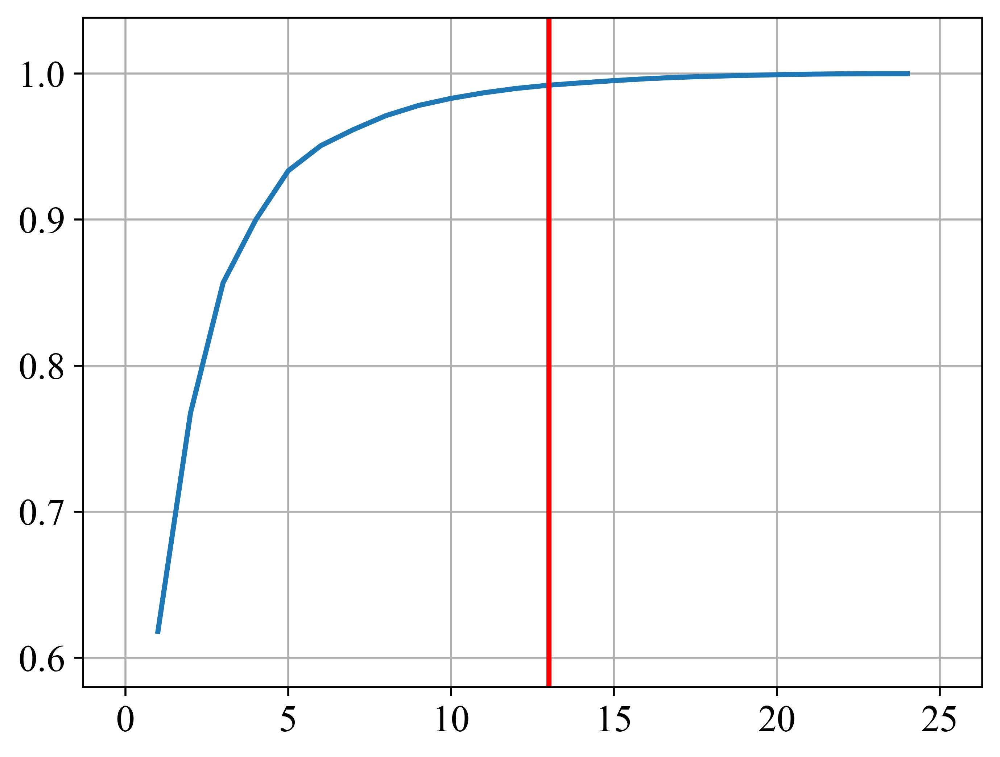

(132481, 25) (132481,) (87841, 25) (87841,)
(132481, 25) (132481,) (63460, 25) (87841,)
21.677072645761516
finding PCA...
Done!


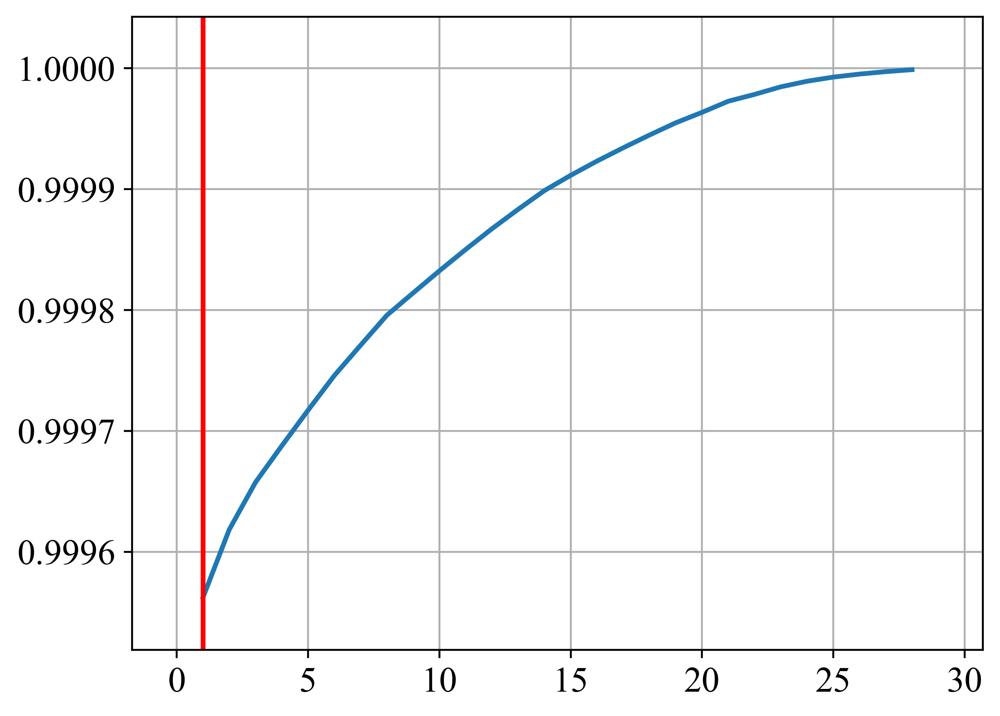

(142403, 29) (142403,) (142404, 29) (142404,)
(142403, 29) (142403,) (142181, 29) (142404,)
nan
finding PCA...
Done!


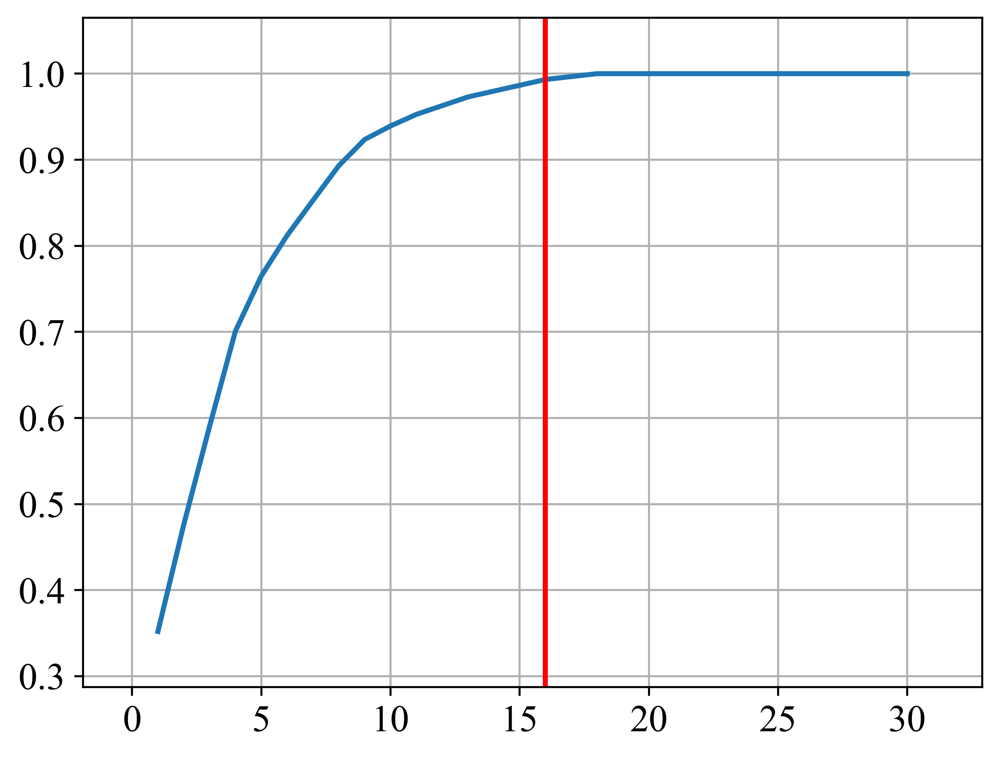

(3682, 55) (3682,) (2856, 55) (2856,)
(3682, 55) (3682,) (2836, 55) (2856,)
inf
finding PCA...
Done!


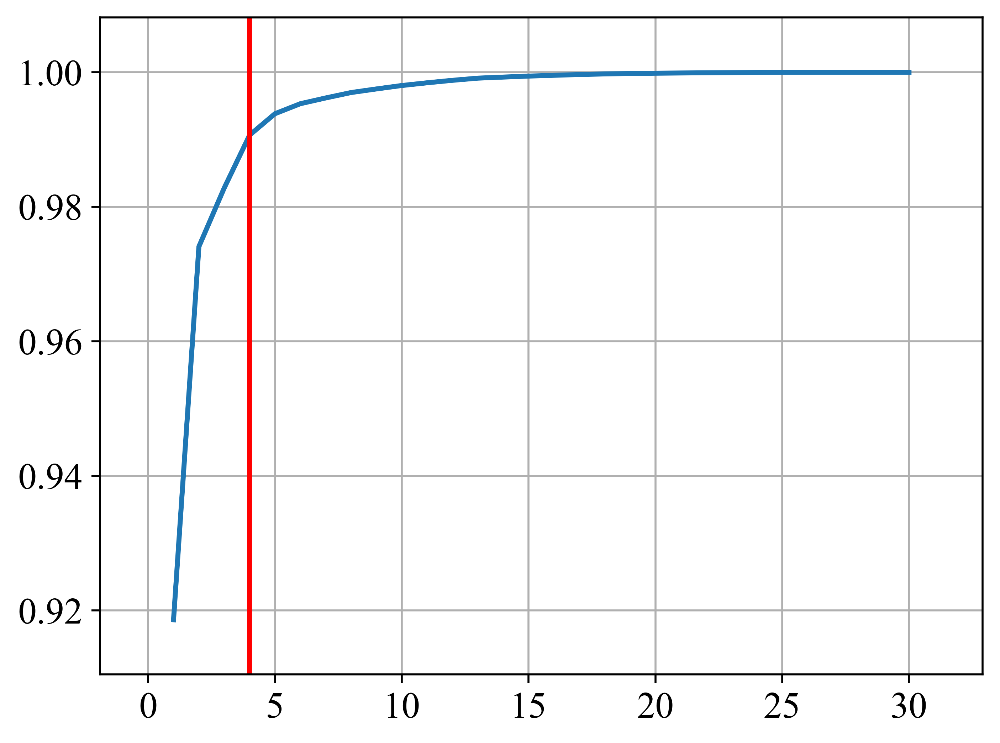

(23706, 38) (23706,) (23707, 38) (23707,)
(23706, 38) (23706,) (22987, 38) (23707,)
12.127360462568223
finding PCA...
Done!


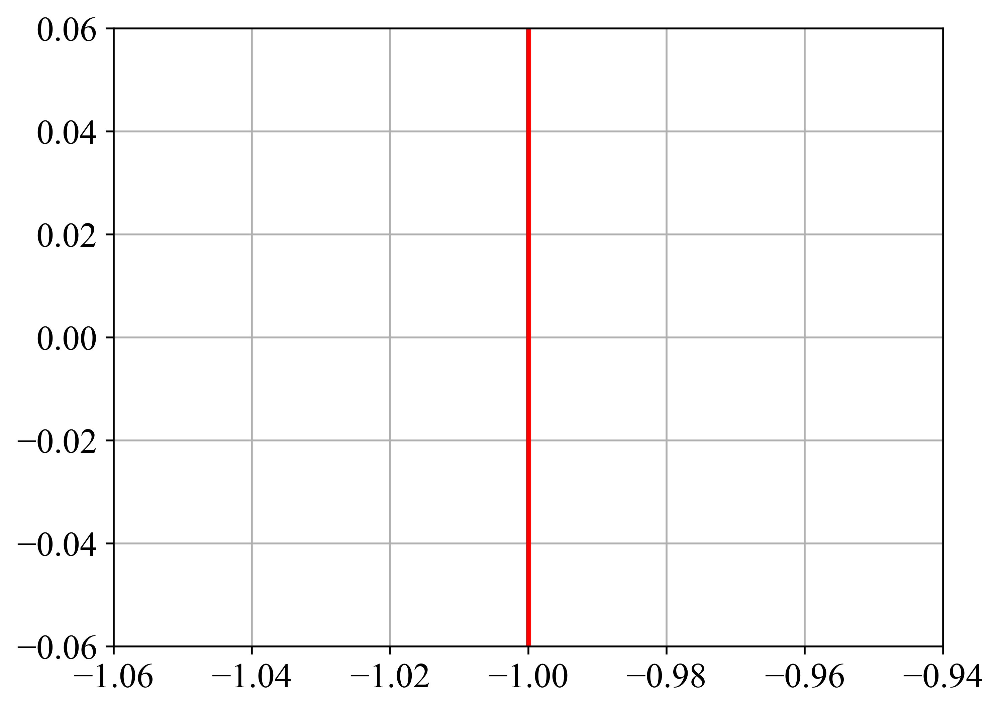

(400, 1) (400,) (1022, 1) (1022,)
(400, 1) (400,) (989, 1) (1022,)


InvalidParameterError: The 'n_components' parameter of PCA must be an int in the range [0, inf), a float in the range (0, 1), a str among {'mle'} or None. Got -1 instead.

In [58]:
datasets = ["SWaT", "WADI", "PSM", "CreditCard", "MSL_P-15", "SMD_machine-1-4", "yahoo_20", "Pump"]
entropies = []

# SWaT
train_X, train_y, test_X, test_y = DataFactory.load_SWaT()
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# WADI
train_X, train_y, test_X, test_y = DataFactory.load_WADI()
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# PSM
train_X, train_y, test_X, test_y = DataFactory.load_PSM()
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# CreditCard
train_X, train_y, test_X, test_y = DataFactory.load_CreditCard()
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# MSL_P-15
train_X, train_y, test_X, test_y = DataFactory.load_MSL("P-15")
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# SMD_machine-1-4
train_X, train_y, test_X, test_y = DataFactory.load_SMD("machine-1-4")
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# yahoo_20
train_X, train_y, test_X, test_y = DataFactory.load_yahoo("20")
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# Pump
train_X, train_y, test_X, test_y = DataFactory.load_Pump()
e = plot_pcavar_return_entropy(train_X, train_y, test_X, test_y)
entropies.append(e)

# Basic Bar Chart
plt.bar(datasets, entropies)
plt.title('Entropy of Kernel Density Estimate', fontsize=20)
plt.xlabel('Dataset', fontsize=18)
plt.ylabel('Entropy', fontsize=18)
plt.show()

<function DataFactory.load_PSM at 0x000001F32070F520>
(132481, 25) (132481,) (87841, 25) (87841,)
finding PCA...
Done!


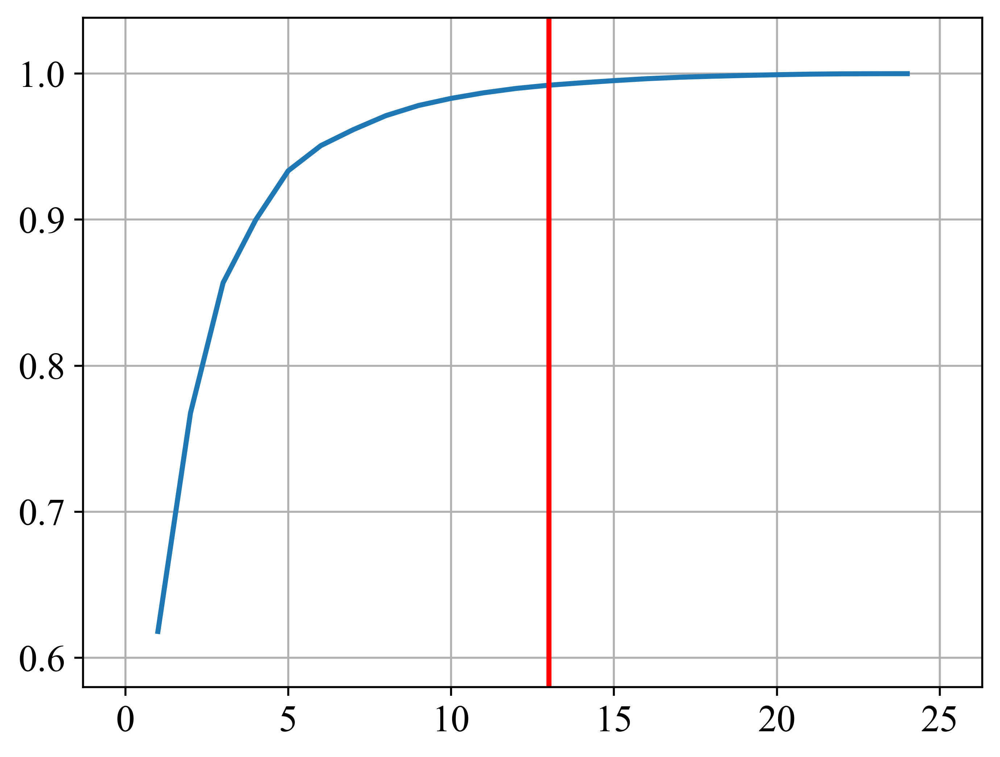

> c:\users\dongmin kim\appdata\local\temp\ipykernel_268\68748385.py(30)<module>()

ipdb> exit


In [37]:

entropies = []
fns = [DataFactory.load_PSM, DataFactory.load_SWaT, DataFactory.load_WADI, DataFactory.load_CreditCard]
for f in fns:
    print("="*20)
    print(f)
    train_X, train_y, test_X, test_y = f()
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    evar = []
    
    print("finding PCA...")
    T, C = train_X.shape
    x = range(1, min(C, 31))
    n_ = 0
    for n in x:
        pca = PCA(n_components=n)
        Xpca = pca.fit_transform(train_X)
        #print(Xpca.shape)
        #print(pca.explained_variance_ratio_)
        evar.append(sum(pca.explained_variance_ratio_))
        if n_ == 0 and sum(pca.explained_variance_ratio_) > 0.99 :
            n_ = n
    print("Done!")
    plt.plot(x, evar)
    plt.axvline(n_)
    plt.show()
    
    # kde of PCA'ed outputs.
    pca = PCA(n_components=n_) 
    Xpca_train = pca.fit_transform(train_X)
    Xpca_test = pca.fit_transform(test_X)
    
    #Xm = np.concatenate([Xpca_train, Xpca_test]).min(axis=0)
    #XM = np.concatenate([Xpca_train, Xpca_test]).max(axis=0)
    
    #grid = np.linspace(Xm, XM, 100).T
    
    e = kldiv(Xpca_train, Xpca_test)
    #e = entropy(test_kde(grid), train_kde(grid)) # how much information should be gained, from train, to test.
    print(e)
    entropies.append(e)
    print("="*20)
    
# Basic Bar Chart
plt.bar(datasets, entropies)
plt.title('Entropy of Kernel Density Estimate', fontsize=20)
plt.xlabel('Dataset', fontsize=18)
plt.ylabel('Entropy', fontsize=18)
plt.show()
    

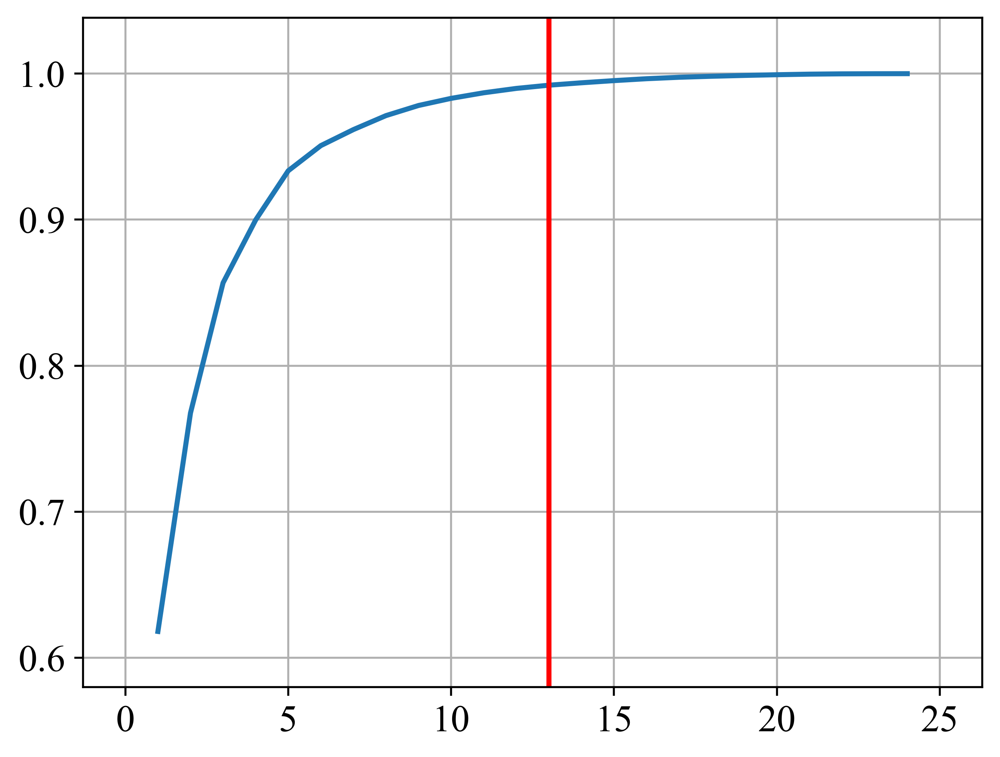

In [32]:
# PSM
train_X, train_y, test_X, test_y = DataFactory.load_PSM()
T, C = train_X.shape
evar = []
x = range(1, min(31, C))
n_ = 0
for n in x:
    pca = PCA(n_components=n) # 주성분을 몇개로 할지 결정
    Xpca = pca.fit_transform(train_X)
    #print(Xpca.shape)
    #print(pca.explained_variance_ratio_)
    evar.append(sum(pca.explained_variance_ratio_))
    if n_ == 0 and sum(pca.explained_variance_ratio_) > 0.99 :
        n_ = n
plt.plot(x, evar)
plt.axvline(n_)
plt.show()

In [33]:
pca = PCA(n_components=n_) 
Xpca_train = pca.fit_transform(train_X)
Xpca_test = pca.fit_transform(test_X)

In [36]:
kldiv(Xpca_train, Xpca_test)

22.211449826485612

## gaussian kde

In [57]:
train_kde = gaussian_kde(Xpca_train.T)
test_kde = gaussian_kde(Xpca_test.T)

In [58]:
np.concatenate([train_X, test_X]).shape

(946716, 51)

In [59]:
Xm = np.concatenate([Xpca_train, Xpca_test]).min(axis=0)
XM = np.concatenate([Xpca_train, Xpca_test]).max(axis=0)

In [63]:
grid = np.linspace(Xm, XM, 100).T

In [64]:
grid.shape

(13, 100)

In [65]:
entropy(train_kde(grid), test_kde(grid))

105.66848097653478

In [18]:

#gaussian_kde(train_X[:, c])

xmin = train_X[:, c].min()
xmax = train_X[:, c].max()

grid = np.linspace(xmin, xmax, 100)
grid

array([-4.01381445, -3.95491649, -3.89601853, -3.83712058, -3.77822262,
       -3.71932466, -3.6604267 , -3.60152875, -3.54263079, -3.48373283,
       -3.42483487, -3.36593692, -3.30703896, -3.248141  , -3.18924304,
       -3.13034508, -3.07144713, -3.01254917, -2.95365121, -2.89475325,
       -2.8358553 , -2.77695734, -2.71805938, -2.65916142, -2.60026347,
       -2.54136551, -2.48246755, -2.42356959, -2.36467163, -2.30577368,
       -2.24687572, -2.18797776, -2.1290798 , -2.07018185, -2.01128389,
       -1.95238593, -1.89348797, -1.83459002, -1.77569206, -1.7167941 ,
       -1.65789614, -1.59899819, -1.54010023, -1.48120227, -1.42230431,
       -1.36340635, -1.3045084 , -1.24561044, -1.18671248, -1.12781452,
       -1.06891657, -1.01001861, -0.95112065, -0.89222269, -0.83332474,
       -0.77442678, -0.71552882, -0.65663086, -0.59773291, -0.53883495,
       -0.47993699, -0.42103903, -0.36214107, -0.30324312, -0.24434516,
       -0.1854472 , -0.12654924, -0.06765129, -0.00875333,  0.05

In [19]:
kernel = gaussian_kde(train_X[:, c])

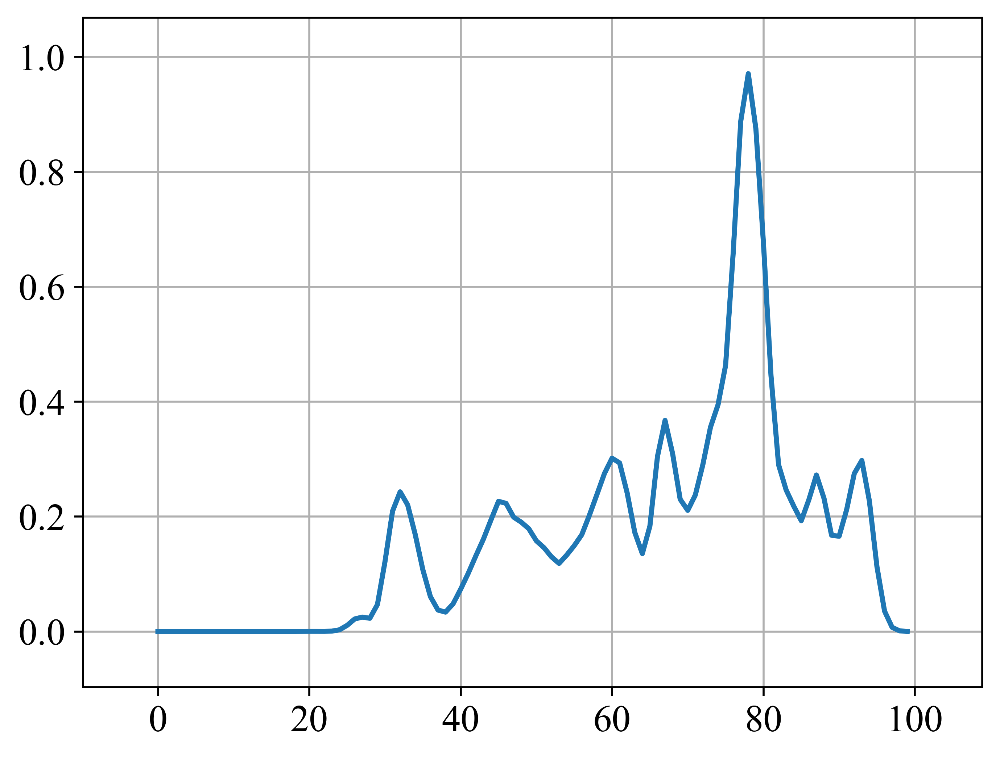

In [21]:
plt.plot(kernel(grid))

In [9]:
from sklearn.neighbors import KernelDensity
kde_emp = KernelDensity(bandwidth=5e-5)
emp_values = np.array([0.000618, 0.000425, 0.000597, 0.000528, 0.000393, 0.000721,
   0.000674, 0.000703, 0.000632, 0.000383, 0.000466, 0.000919,
   0.001419, 0.00063 , 0.000433, 0.000516, 0.001419, 0.000655,
   0.000674, 0.000676, 0.000694, 0.000396, 0.000688, 0.00061 ,
   0.000687, 0.000633, 0.000601, 0.00061 , 0.000747, 0.000356,
   0.000824, 0.000931, 0.000691, 0.000907, 0.000553, 0.000748,
   0.000828, 0.000907, 0.000457, 0.000494])
kde_emp = KernelDensity().fit(emp_values.reshape(-1, 1))

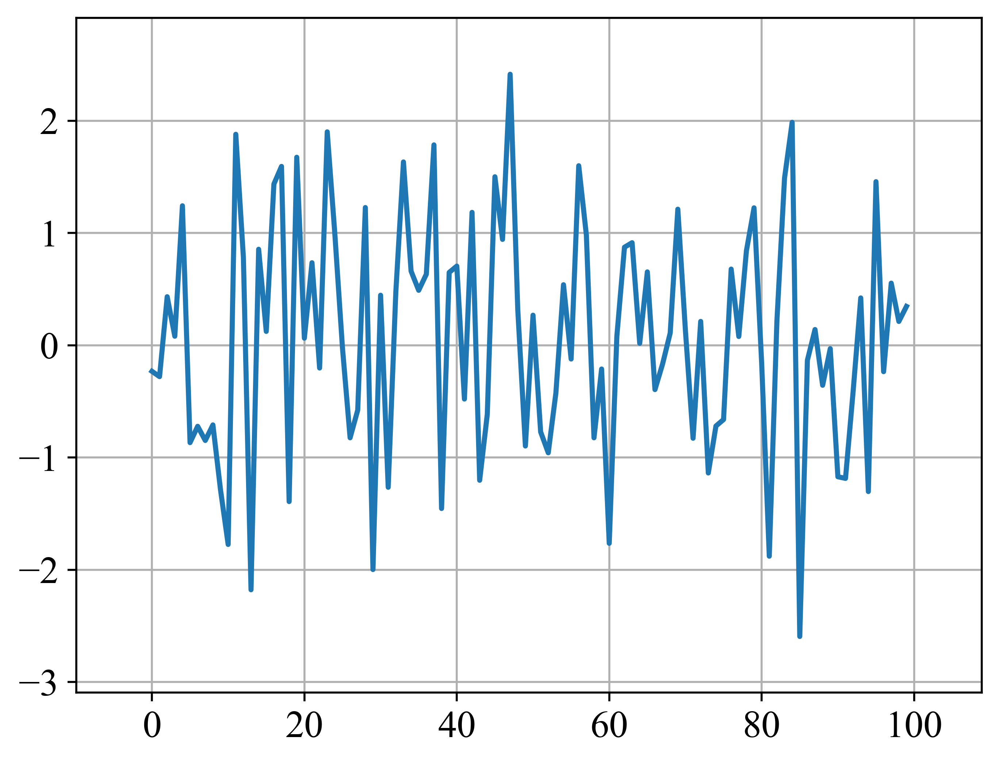

In [16]:
plt.plot(kde_emp.sample(100))

In [13]:

kde_emp(np.arange(-10, 0, 0.01))

TypeError: 'KernelDensity' object is not callable

In [ ]:
from sklearn.neighbors import KernelDensity
kde_emp = KernelDensity(bandwidth=5e-5)
kde_emp.fit(emp_values.reshape(-1, 1))

In [28]:
#!/usr/bin/env python
# Written by Greg Ver Steeg
# See readme.pdf for documentation
# Or go to http://www.isi.edu/~gregv/npeet.html

import warnings

import numpy as np
import numpy.linalg as la
from numpy import log
from scipy.special import digamma
from sklearn.neighbors import BallTree, KDTree

# CONTINUOUS ESTIMATORS


def entropy(x, k=3, base=2):
    """The classic K-L k-nearest neighbor continuous entropy estimator
    x should be a list of vectors, e.g. x = [[1.3], [3.7], [5.1], [2.4]]
    if x is a one-dimensional scalar and we have four samples
    """
    assert k <= len(x) - 1, "Set k smaller than num. samples - 1"
    x = np.asarray(x)
    n_elements, n_features = x.shape
    x = add_noise(x)
    tree = build_tree(x)
    nn = query_neighbors(tree, x, k)
    const = digamma(n_elements) - digamma(k) + n_features * log(2)
    return (const + n_features * np.log(nn).mean()) / log(base)


def centropy(x, y, k=3, base=2):
    """The classic K-L k-nearest neighbor continuous entropy estimator for the
    entropy of X conditioned on Y.
    """
    xy = np.c_[x, y]
    entropy_union_xy = entropy(xy, k=k, base=base)
    entropy_y = entropy(y, k=k, base=base)
    return entropy_union_xy - entropy_y


def tc(xs, k=3, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    entropy_features = [entropy(col, k=k, base=base) for col in xs_columns]
    return np.sum(entropy_features) - entropy(xs, k, base)


def ctc(xs, y, k=3, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    centropy_features = [centropy(col, y, k=k, base=base) for col in xs_columns]
    return np.sum(centropy_features) - centropy(xs, y, k, base)


def corex(xs, ys, k=3, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    cmi_features = [mi(col, ys, k=k, base=base) for col in xs_columns]
    return np.sum(cmi_features) - mi(xs, ys, k=k, base=base)


def mi(x, y, z=None, k=3, base=2, alpha=0):
    """Mutual information of x and y (conditioned on z if z is not None)
    x, y should be a list of vectors, e.g. x = [[1.3], [3.7], [5.1], [2.4]]
    if x is a one-dimensional scalar and we have four samples
    """
    assert len(x) == len(y), "Arrays should have same length"
    assert k <= len(x) - 1, "Set k smaller than num. samples - 1"
    x, y = np.asarray(x), np.asarray(y)
    x, y = x.reshape(x.shape[0], -1), y.reshape(y.shape[0], -1)
    x = add_noise(x)
    y = add_noise(y)
    points = [x, y]
    if z is not None:
        z = np.asarray(z)
        z = z.reshape(z.shape[0], -1)
        points.append(z)
    points = np.hstack(points)
    # Find nearest neighbors in joint space, p=inf means max-norm
    tree = build_tree(points)
    dvec = query_neighbors(tree, points, k)
    if z is None:
        a, b, c, d = (
            avgdigamma(x, dvec),
            avgdigamma(y, dvec),
            digamma(k),
            digamma(len(x)),
        )
        if alpha > 0:
            d += lnc_correction(tree, points, k, alpha)
    else:
        xz = np.c_[x, z]
        yz = np.c_[y, z]
        a, b, c, d = (
            avgdigamma(xz, dvec),
            avgdigamma(yz, dvec),
            avgdigamma(z, dvec),
            digamma(k),
        )
    return (-a - b + c + d) / log(base)


def cmi(x, y, z, k=3, base=2):
    """Mutual information of x and y, conditioned on z
    Legacy function. Use mi(x, y, z) directly.
    """
    return mi(x, y, z=z, k=k, base=base)


def kldiv(x, xp, k=3, base=2):
    """KL Divergence between p and q for x~p(x), xp~q(x)
    x, xp should be a list of vectors, e.g. x = [[1.3], [3.7], [5.1], [2.4]]
    if x is a one-dimensional scalar and we have four samples
    """
    assert k < min(len(x), len(xp)), "Set k smaller than num. samples - 1"
    assert len(x[0]) == len(xp[0]), "Two distributions must have same dim."
    x, xp = np.asarray(x), np.asarray(xp)
    x, xp = x.reshape(x.shape[0], -1), xp.reshape(xp.shape[0], -1)
    d = len(x[0])
    n = len(x)
    m = len(xp)
    const = log(m) - log(n - 1)
    tree = build_tree(x)
    treep = build_tree(xp)
    nn = query_neighbors(tree, x, k)
    nnp = query_neighbors(treep, x, k - 1)
    return (const + d * (np.log(nnp).mean() - np.log(nn).mean())) / log(base)


def lnc_correction(tree, points, k, alpha):
    e = 0
    n_sample = points.shape[0]
    for point in points:
        # Find k-nearest neighbors in joint space, p=inf means max norm
        knn = tree.query(point[None, :], k=k + 1, return_distance=False)[0]
        knn_points = points[knn]
        # Substract mean of k-nearest neighbor points
        knn_points = knn_points - knn_points[0]
        # Calculate covariance matrix of k-nearest neighbor points, obtain eigen vectors
        covr = knn_points.T @ knn_points / k
        _, v = la.eig(covr)
        # Calculate PCA-bounding box using eigen vectors
        V_rect = np.log(np.abs(knn_points @ v).max(axis=0)).sum()
        # Calculate the volume of original box
        log_knn_dist = np.log(np.abs(knn_points).max(axis=0)).sum()

        # Perform local non-uniformity checking and update correction term
        if V_rect < log_knn_dist + np.log(alpha):
            e += (log_knn_dist - V_rect) / n_sample
    return e


# DISCRETE ESTIMATORS
def entropyd(sx, base=2):
    """Discrete entropy estimator
    sx is a list of samples
    """
    unique, count = np.unique(sx, return_counts=True, axis=0)
    # Convert to float as otherwise integer division results in all 0 for proba.
    proba = count.astype(float) / len(sx)
    # Avoid 0 division; remove probabilities == 0.0 (removing them does not change the entropy estimate as 0 * log(1/0) = 0.
    proba = proba[proba > 0.0]
    return np.sum(proba * np.log(1.0 / proba)) / log(base)


def midd(x, y, base=2):
    """Discrete mutual information estimator
    Given a list of samples which can be any hashable object
    """
    assert len(x) == len(y), "Arrays should have same length"
    return entropyd(x, base) - centropyd(x, y, base)


def cmidd(x, y, z, base=2):
    """Discrete mutual information estimator
    Given a list of samples which can be any hashable object
    """
    assert len(x) == len(y) == len(z), "Arrays should have same length"
    xz = np.c_[x, z]
    yz = np.c_[y, z]
    xyz = np.c_[x, y, z]
    return (
        entropyd(xz, base)
        + entropyd(yz, base)
        - entropyd(xyz, base)
        - entropyd(z, base)
    )


def centropyd(x, y, base=2):
    """The classic K-L k-nearest neighbor continuous entropy estimator for the
    entropy of X conditioned on Y.
    """
    xy = np.c_[x, y]
    return entropyd(xy, base) - entropyd(y, base)


def tcd(xs, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    entropy_features = [entropyd(col, base=base) for col in xs_columns]
    return np.sum(entropy_features) - entropyd(xs, base)


def ctcd(xs, y, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    centropy_features = [centropyd(col, y, base=base) for col in xs_columns]
    return np.sum(centropy_features) - centropyd(xs, y, base)


def corexd(xs, ys, base=2):
    xs_columns = np.expand_dims(xs, axis=0).T
    cmi_features = [midd(col, ys, base=base) for col in xs_columns]
    return np.sum(cmi_features) - midd(xs, ys, base)


# MIXED ESTIMATORS
def micd(x, y, k=3, base=2, warning=True):
    """If x is continuous and y is discrete, compute mutual information"""
    assert len(x) == len(y), "Arrays should have same length"
    entropy_x = entropy(x, k, base)

    y_unique, y_count = np.unique(y, return_counts=True, axis=0)
    y_proba = y_count / len(y)

    entropy_x_given_y = 0.0
    for yval, py in zip(y_unique, y_proba):
        x_given_y = x[(y == yval).all(axis=1)]
        if k <= len(x_given_y) - 1:
            entropy_x_given_y += py * entropy(x_given_y, k, base)
        else:
            if warning:
                warnings.warn(
                    "Warning, after conditioning, on y={yval} insufficient data. "
                    "Assuming maximal entropy in this case.".format(yval=yval)
                )
            entropy_x_given_y += py * entropy_x
    return abs(entropy_x - entropy_x_given_y)  # units already applied


def midc(x, y, k=3, base=2, warning=True):
    return micd(y, x, k, base, warning)


def centropycd(x, y, k=3, base=2, warning=True):
    return entropy(x, base) - micd(x, y, k, base, warning)


def centropydc(x, y, k=3, base=2, warning=True):
    return centropycd(y, x, k=k, base=base, warning=warning)


def ctcdc(xs, y, k=3, base=2, warning=True):
    xs_columns = np.expand_dims(xs, axis=0).T
    centropy_features = [
        centropydc(col, y, k=k, base=base, warning=warning) for col in xs_columns
    ]
    return np.sum(centropy_features) - centropydc(xs, y, k, base, warning)


def ctccd(xs, y, k=3, base=2, warning=True):
    return ctcdc(y, xs, k=k, base=base, warning=warning)


def corexcd(xs, ys, k=3, base=2, warning=True):
    return corexdc(ys, xs, k=k, base=base, warning=warning)


def corexdc(xs, ys, k=3, base=2, warning=True):
    return tcd(xs, base) - ctcdc(xs, ys, k, base, warning)


# UTILITY FUNCTIONS


def add_noise(x, intens=1e-10):
    # small noise to break degeneracy, see doc.
    return x + intens * np.random.random_sample(x.shape)


def query_neighbors(tree, x, k):
    return tree.query(x, k=k + 1)[0][:, k]


def count_neighbors(tree, x, r):
    return tree.query_radius(x, r, count_only=True)


def avgdigamma(points, dvec):
    # This part finds number of neighbors in some radius in the marginal space
    # returns expectation value of <psi(nx)>
    tree = build_tree(points)
    dvec = dvec - 1e-15
    num_points = count_neighbors(tree, points, dvec)
    return np.mean(digamma(num_points))


def build_tree(points):
    if points.shape[1] >= 20:
        return BallTree(points, metric="chebyshev")
    return KDTree(points, metric="chebyshev")
